# Et dypdykk inn i skips stabilitet

**Gruppemedlemmer: 10002 , 10051 og 10132**

Gjennom menneskehetens historie har båten vært et essensielt fremkomstmiddel. Uansett om man legger ut for å oppdage nye land, eller tar sin daglige fisketur, er man avhengig av at transportmiddelet er pålitelig. Det holder ikke at føreren av båten er kompetent, båten han fører må også holde mål. Dette er i stor grad bestemt av skipets design, og i dette prosjektet skal vi modellere hvordan ulike egenskaper ved skipet påvirker dets oppførsel i vann. 

For å kunne modellere dette skipet i vann, trenger vi først en grunnleggende modell for skipet. Vi velger her å se på et skip formet som en halv sylinder, men der vi bare studerer et tverrsnitt av det. Videre behandler vi skipet som et stivt legeme, slik at alle tverrsnitt i lengderetninga beveger seg på samme måte. Da finnes det enkelte størrelser som karakteriserer skipet, og som vi vil holde konstante gjennom hele prosjektet. Dette er for eksempel arealet av tverrsnittet, og treghetsmomentet til tverrsnittet rundt en akse gjennom massesenteret.

Under er en illustrasjon av modellen vi bruker, hentet fra prosjektbeskrivelsen (Aase et. al, 2022).

![Picture title](Skipsillustrasjon.png)

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import time
import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning) 
from matplotlib import animation
from numpy.linalg import solve, norm
from IPython.display import HTML, Image
from scipy.optimize import curve_fit
plt.rcParams.update({'figure.figsize': (15,4), 'font.size': 14, 'axes.titlesize': 16, 'figure.titlesize': 18, 'animation.html': 'jshtml'})
!apt update && apt install -y ffmpeg libsm6 libxext6

# As Python is based on the English language, we have chosen to write the code and comments in English

Get:1 http://security.debian.org/debian-security buster/updates InRelease [65.4 kB]
Hit:2 http://deb.debian.org/debian buster InRelease
Get:3 http://deb.debian.org/debian buster-updates InRelease [51.9 kB]
Fetched 117 kB in 0s (276 kB/s)



10 packages can be upgraded. Run 'apt list --upgradable' to see them.



libsm6 is already the newest version (2:1.2.3-1).
libxext6 is already the newest version (2:1.3.3-1+b2).
ffmpeg is already the newest version (7:4.1.8-0+deb10u1).
0 upgraded, 0 newly installed, 0 to remove and 10 not upgraded.


In [2]:
# Definitions of constants that will come in handy throughout the project

density_water = 1000                 #[kg/m^2]
density_ship = 500                   #[kg/m^2]
R = 10                               #[m], the ship's radius
A_ship = 1/2*np.pi*R**2              #[m^2], the ship's area
m = A_ship*density_ship              #[kg], the mass of the ship
I_C = 1/2*m*R**2*(1-32/(9*np.pi**2)) #[kgm^2], the ship's moment of inertia at point C, the center of mass,
h_MC = (4*R)/(3*np.pi)               #[m], Distance from M, the ship's meta center, to C.

# We will generally use subscripts, such as MC, to denote the distance between two points, for instance M and C

Videre har vi følgende definisjoner for relevante likevektersstørrelser

$\beta - \sin \beta = \pi \sigma /\sigma_0$

$Y_{MB}^0 = Y_{MB}(\beta)$

$y_M^0 = R\cos (\beta/2)$

$y_C^0 = y_M^0 - h$

$y_B^0 = y_M^0-Y_{MB}^0$

$y_D^0 = y_M^0 - R$

Før vi setter skipet i bevegelse, trenger vi å kunne beskrive det motsatte, det statiske tilfellet. For å kunne modellere dette trenger vi en rekke likevektskonstanter. Vi ser at for å kunne beregne disse likevektskonstantene trenger vi kjennskap til størrelsen av variabelen $\beta$. For å få dette, trenger vi å løse likninga $\beta-\sin(\beta)=\pi\cdot\frac{\sigma}{\sigma_0}$. Her representerer $\beta$ vinkelen til sirkelsegmentet under vann, mens $\sigma$ og $\sigma_0$ er skipet og vannets massetetthet. Likninga er imidlertid ikke lett å løse analytisk, og her kommer numerikken inn. Her har vi primært valgt å bruke Newtons metode, som er en form for fikspunktiterasjon, ettersom den vil konvergere kvadratisk gitt en god nok startverdi, det vil si $|e_{n+1}|\leq M |e_n|^2$ (Kværnø, 2022a).

Fikspunktiterasjoner går ut på å regne ut en ny $\beta$, ved hjelp av forrige verdi for størrelsen. For Newtons metode bruker vi da formelen

$$\beta_{n+1}=\beta_n+f(\beta_n)/f'(\beta_n)$$

med $f(\beta_n)=\beta_n-\sin\beta_n-\pi\cdot\sigma/\sigma_0$, og $f'(\beta_n)=1-\cos\beta_n$.

Vi har også brukt fikspunktiterasjonen $\beta_{n+1} = \sin(\beta_{n})+\pi \cdot \frac{\sigma}{\sigma_0}$, for kontroll.

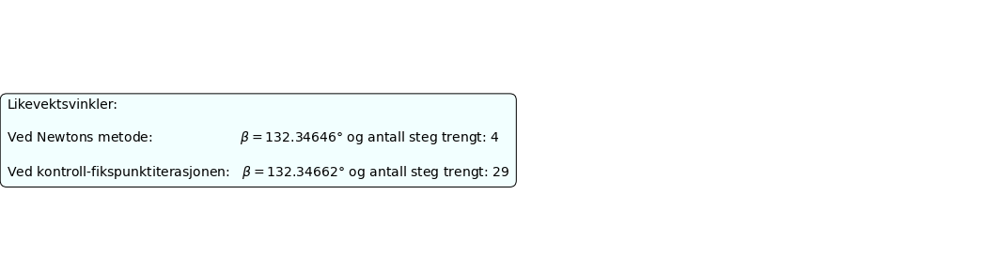

In [3]:
#Functions used in Newton's method for our given problem
def f(beta): #the equation we want to solve, written on the form f(beta)=0
    return beta - np.sin(beta) - np.pi*density_ship/density_water

def df(beta): #the derivative of f(beta)
    return 1 - np.cos(beta)

def Newtons_Method_step(x, f, df):
    return x-f(x)/df(x)

#Fixpoint-iteration used to compare with the results from Newton's method
def h(beta, var1, var2):
    return np.sin(beta) + np.pi*density_ship/density_water

def fixed_point_solver(f, df, x0, tol=1.e-6, max_iter=10000, method = Newtons_Method_step):
    x = x0
    for k in range(max_iter):
        x_old = x
        x = method(x, f, df)
        if abs(x-x_old) < tol:
            break
    return x, k+1

#We now try to calculate our beta with initial guesses of beta = 2 rad

beta_Newton, number_of_iterations_Newton = fixed_point_solver(f, df, 2, 0.00001, 10000)

beta_control, number_of_iterations_control = fixed_point_solver(f, df, 2, 0.00001, 10000, h)

plt.text(0, 0.3,"Likevektsvinkler:\n\n"
    +r"Ved Newtons metode:                     $\beta=$" + f"{np.degrees(beta_Newton):.5f}" + r"$\degree$ og antall steg trengt: " + f"{number_of_iterations_Newton}\n\n"
    +r"Ved kontroll-fikspunktiterasjonen:   $\beta=$" + f"{np.degrees(beta_control):.5f}" + r"$\degree$ og antall steg trengt: " + f"{number_of_iterations_control}"
    , size=14, bbox=dict(boxstyle="round, pad=0.5",fc=(0.95, 1, 1)))
plt.axis("off")
plt.tight_layout()
plt.show()

Før vi beveger oss videre med prosjektet, ønsker vi å kontrollere enda mer at Newtons metode faktisk konvergerer mot riktig løsning, og at dette er den eneste løsninga i intervallet vårt. I så fall må kravene i Fikspunktteoremet være oppfylte, for en funksjon $h(x)$. Denne vil være høyreside i Newtons metode, altså $h(x)=N(x)=x-f(x)/f'(x)$. Kravene for funksjonen er at absoluttverdien av dens førstederiverte må være strengt begrenset av en konstant $L < 1$, og at funksjonens verdimengde er en delmengde av intervallet vi ser på (Kværnø, 2022a). At kravene er oppfylte illustreres i plottene nedenfor, og derfor er vi også sikrere på at vi har funnet rikitg $\beta$. Vi ser også at hvis vi hadde valgt startverdien vår som $1.5$ rad kunne vi imidlertid ikke garantert entydighet eller eksistens, da kravene ikke er oppfylte. 

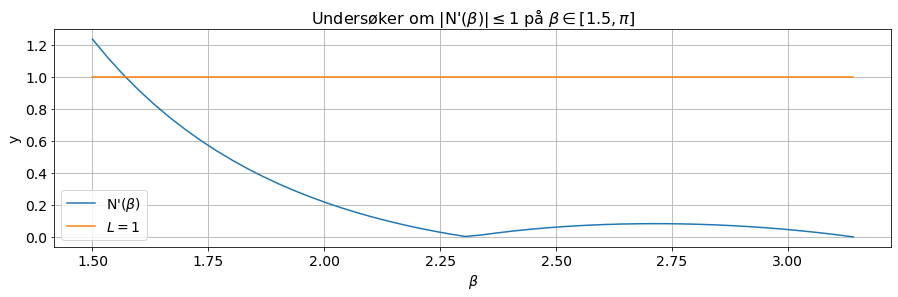

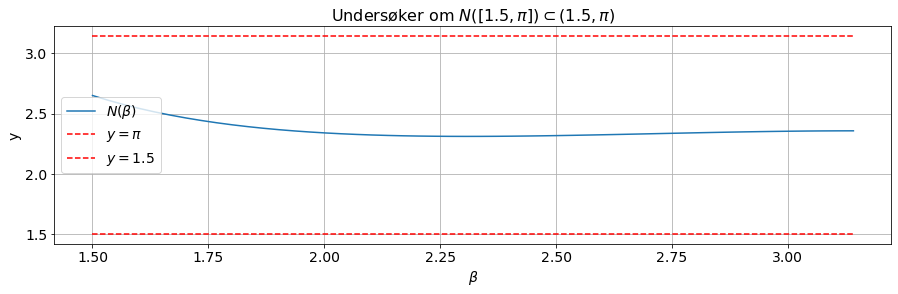

In [4]:
def ddf(beta): #second derivative of f(beta)
    return np.sin(beta)

def derivative_of_Newtons_Method_step(f, df, ddf, x): #derivative of a step in Newton's method
    return (f(x)*ddf(x))/(df(x)**2)

### Plot below ###

x = np.linspace(1.5, np.pi, 50)

plt.figure()
plt.plot(x, np.abs(derivative_of_Newtons_Method_step(f, df, ddf, x)), label=r"N'($\beta$)")
plt.plot(x, [1]*50, label=r"$L=1$")
plt.xlabel(r'$\beta$')
plt.ylabel("y")
plt.title(r"Undersøker om |N'($\beta$)|$\leq1$ på $\beta \in [1.5, \pi]$")
plt.legend()
plt.grid(True)
plt.show()

plt.figure()
plt.plot(x, Newtons_Method_step(x, f, df), label=r"$N(\beta$)")
plt.plot(x, [np.pi]*50, "--", label=r"$y=\pi$", color="red")
plt.plot(x, [1.5]*50,"--", label=r"$y=1.5$", color="red")
plt.xlabel(r'$\beta$')
plt.ylabel("y")
plt.title(r"Undersøker om $N([1.5,\pi]) \subset (1.5, \pi)$")
plt.legend()
plt.grid(True)
plt.show()

Med en verdi for $\beta$ er vi nå i stand til å definere likevektsstørrelser, som ikke bare gjelder skipets geometri, men også skipets egenskaper når det er sjøsatt. Eksempler på disse størrelsene er høyden til massesenteret, $y_C$, oppdriftssenteret, $y_B$, og skipets laveste punkt, $y_D$. Ved å legge nullpunktet for y-aksen til vannoverflata, får vi følgende resultater for disse størrelsene i likevekt.

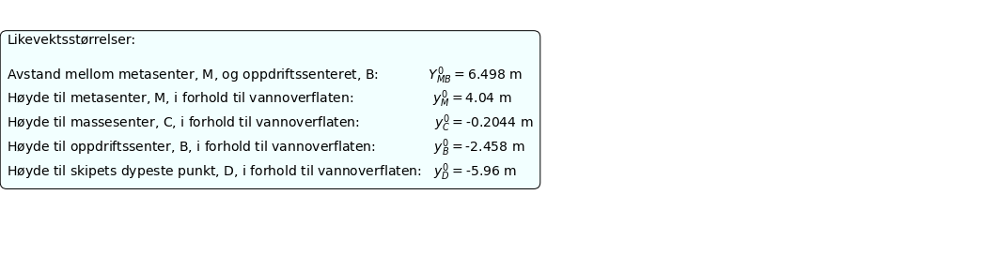

In [5]:
def Y_MB(gamma):
    return R*(4*np.sin(gamma/2)**3)/(3*(gamma-np.sin(gamma)))

beta,number_of_iterations_Newton = fixed_point_solver(f, df, 2, 0.00001, 10000)

Y_MB0 = Y_MB(beta)
y_M0 = R*np.cos(beta/2)
y_C0 = y_M0 - h_MC
y_B0 = y_M0-Y_MB0
y_D0 = y_M0 - R

plt.text(0, 0.3,"Likevektsstørrelser:\n\n"
    +f"Avstand mellom metasenter, M, og oppdriftssenteret, B:            "+ r"$Y_{MB}^0=$" + f"{Y_MB0:.4} m\n"
    +f"Høyde til metasenter, M, i forhold til vannoverflaten:                   "+ r"$y_M^0=$" + f"{y_M0:.4} m\n"
    +f"Høyde til massesenter, C, i forhold til vannoverflaten:                  " +r"$y_C^0=$"  +      f"{y_C0:.4} m\n"
    +f"Høyde til oppdriftssenter, B, i forhold til vannoverflaten:              "+ r"$y_B^0=$"+f"{y_B0:.4} m\n"
    +f"Høyde til skipets dypeste punkt, D, i forhold til vannoverflaten:   "+r"$y_D^0=$"+ f"{y_D0:.4} m", size=14, bbox=dict(boxstyle="round, pad=0.5",fc=(0.95, 1, 1)))
plt.axis("off")
plt.tight_layout()
plt.show()

Med utgangspunkt i situasjonen i likevekt, er vi nå klare til å la skipet rotere om massesenteret, C. Hvis vi neglisjerer andre krefter enn skipets tyngde og oppdrift, vil rotasjonen om C bare få bidrag fra oppdriften, ettersom tyngdekraften virker i massesenteret. Fra Newtons andre lov for rotasjon, $\Sigma\tau=I_C\frac{d\omega}{dt}$, får vi følgende for vinkelakselerasjonen:

$$\frac{d\omega}{dt} = \frac{-F_B h_{MC} \sin(\theta)}{I_C} \qquad $$
der 
$F_B = A \sigma_0 g \quad$ og 
$A$ er mengden fortrengt vann

Vi har dermed settet med differensiallikninger:

$$\theta ' = \omega, \qquad\qquad\qquad \theta(0) = \theta_0$$

$$\omega ' = \frac{-F_B h_{MC} \sin(\theta)}{I_C}, \qquad   \omega(0) = \omega_0$$

Om vi så introduserer vektoren $\vec{w}(t)=[\theta(t), \omega(t)]^T$, kan systemet beskrives på en mer kompakt måte,

$\frac{d\vec{w}}{dt}=\vec{f}(t, \vec{w})$, hvor vi altså har introdusert vektorfunksjonen $\vec{f} = [\omega, \frac{-F_B h_{MC} \sin(\theta)}{I_C}]^T$.

Ved å løse dette systemet av differensiallikninger, kan vi si noe om skipets utslag og vinkelhastighet, altså dets oppførsel i vann. Dette kan gjøres på mange forskjellige måter, men vi har valgt oss Eulers metode som utgangspunkt. Dette er en såkalt ett-stegs metode, hvor vi velger oss et punkt, altså et sett med verdier for $\vec{w}$ og bruker kun dette punktet, for å avgjøre hva neste punkt blir. Denne avgjørelsen er basert på følgende formel, og steglengde, h:

$$\vec{w}_{i+1}=\vec{w_i}+h\vec{f}(t, \vec{w_i})$$



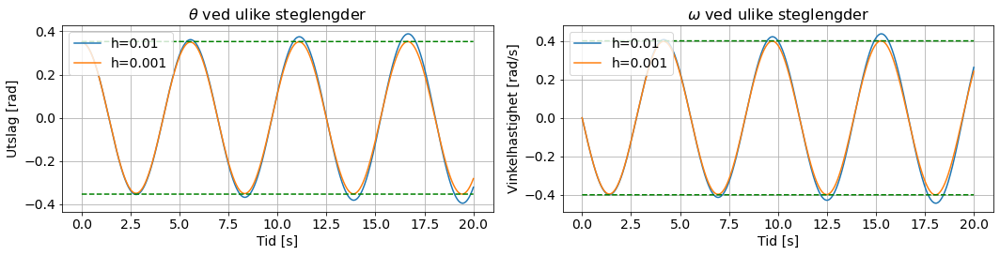

In [6]:
g = 9.81 
F_B_constant = m*g #Will be held constant for now, as the area of the displaced water is constant with a fixed center of mass

def f_fixedC(t, w):
    theta, omega =w[0], w[1]
    d_theta = omega
    d_omega = -F_B_constant*h_MC*np.sin(theta)/I_C

    dw = np.array([d_theta, d_omega])
    return dw

def euler_step(f, t_n, w_n, h):
    t_next = t_n + h
    w_next = w_n + h*f(t_n, w_n)

    return t_next, w_next

#For now, we are only interested in Euler's method, but we develop a general function that may later be used 
#for other methods.

def ODE_solver(t0, t_end, w0, f, h, method):    
    w_array = np.array([w0])
    t_array = np.array(t0)
    t = t0

    while t < t_end:
        if t + h > t_end:
            h = t_end - t
        t, w = method(f, t, w_array[-1], h)
        w_array = np.vstack((w_array, w))
        t_array = np.append(t_array, t)

    return t_array, w_array

### Plot below ###

t0, t_end = 0, 20

theta0, omega0 = np.radians(20), 0
w0 = np.array([theta0, omega0]) #initial displacement and angular velocity

h0 = 1.e-2
h1 = 1.e-3

t_array0, w_array0 = ODE_solver(t0, t_end, w0, f_fixedC, h0, euler_step)
t_array1, w_array1 = ODE_solver(t0, t_end, w0, f_fixedC, h1, euler_step)

plt.figure()
plt.subplot(121)
plt.title(r"$\theta$ ved ulike steglengder")
plt.plot(t_array0, w_array0[:,0], label = f'h={h0}')
plt.plot(t_array1, w_array1[:,0], label = f'h={h1}')
plt.plot(t_array1, np.full_like(t_array1, np.amax(w_array1[:,0])), '--', color = 'g')
plt.plot(t_array1, np.full_like(t_array1, np.amin(w_array1[:,0])), '--', color = 'g')
plt.xlabel('Tid [s]')
plt.ylabel('Utslag [rad]')
plt.grid()
plt.legend(loc=2)

plt.subplot(122)
plt.title(r"$\omega$ ved ulike steglengder")
plt.plot(t_array0, w_array0[:,1], label = f'h={h0}')
plt.plot(t_array1, w_array1[:,1], label = f'h={h1}')
plt.plot(t_array1, np.full_like(t_array1, np.amax(w_array1[:,1])), '--', color = 'g')
plt.plot(t_array1, np.full_like(t_array1, np.amin(w_array1[:,1])), '--', color = 'g')
plt.grid()
plt.legend(loc=2)
plt.xlabel('Tid [s]')
plt.ylabel('Vinkelhastighet [rad/s]')
plt.tight_layout()
plt.show()

I forbindelse med den numeriske løsninga vi har implementert, så vi at steglengden er av stor betydning. Som plottene ovenfor illustrerer, får vi for steglengder større enn $h=0.001$ utslag som øker med tiden. Fordi vi ser på et såpasss idealisert tilfelle, og ser bort fra friksjon og drivkraft, vil det da kun være fysisk mulig at utslagene oscillerer mellom to faste verdier. Fra plottene ser vi at dette oppnås for steglengder lik $h=0.001$ (og mindre). Ved å velge steglengden lik $h=0.001$ får vi fysisk akseptable resultater, og greiere kjøretider enn om vi hadde valgt en mindre $h$. Siden Eulers metode er av første orden, ville vi også generelt fått ti ganger lengre kjøretid, dersom vi hadde redusert steglengden med en faktor på ti.

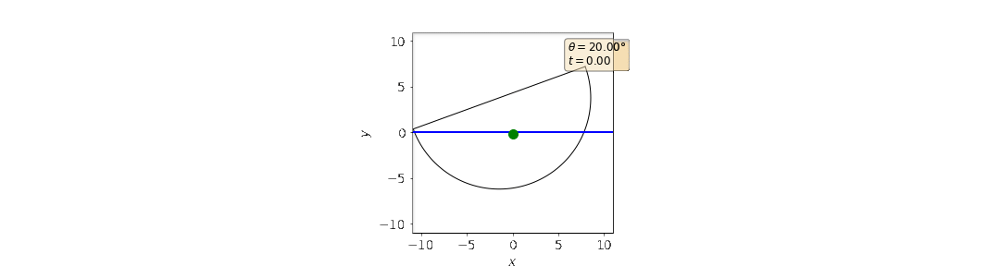

In [7]:
"""
This code has been provided for us by the people that have given us this task, and has been of great help to
visualize our results. Minor changes have been made within the code, to make it run in Notebook-format and 
run in real-time. 
"""

'''Denne koden animerer bevegelsen til båten, gitt at dere sender inn arrays som inneholder tidsverdier t,
skipets helningsvinkel theta, x- og y-koordinatet til skipets massesenter. Disse arraysene brukes i funksjonen
definert nederst "animate_deck_movement". Den grønne sirkelen viser posisjonen til skipets massesenter
Man kan sende inn optional argumenter, disse står beskrevet i funksjonen. For eksempel kan man sende inn et array
som inneholder lastens posisjon relativt metasenteret. Lasten vil da animeres som en rød sirkel.
'''

# M = metasenteret = midt paa dekk
# C = skipets tyngdepunkt

def init_anim():
    """ Initialises the animation.
    """
    global ax, boat, deck, last, CM, venstre_gjerde, høyre_gjerde, textbox_theory
    boat, = plt.plot([], [], color="k", linewidth=1)
    deck, = plt.plot([], [], color="k", linewidth=1)
    sea_surface, = plt.plot([-R*10, R* 10], [0, 0], color='blue', linewidth=2)  # The surface
    last, = plt.plot([], [], color="r", marker="o", markersize=10)
    CM, = plt.plot([], [], color="g", marker="o", markersize=10)
    venstre_gjerde, = plt.plot([], [], color="k", marker="|", markersize=25)
    høyre_gjerde, = plt.plot([], [], color="k", marker="|", markersize=25)
    ax.set_xlim([-R*1.3, R* 1.3])
    ax.set_ylim([-R*1.1, R* 1.1])
    ax.set_xlabel('$x$')
    ax.set_ylabel('$y$')
    ax.set_aspect("equal")
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    textbox_theory = ax.text(0.775, 0.95, '', transform=ax.transAxes, fontsize=12, verticalalignment='top', bbox=props)

    return ax, boat, deck, last, CM,venstre_gjerde,høyre_gjerde, textbox_theory


def animate(M, theta, t, x_C, y_C, s_L, gjerde=False):
    global ax, boat, deck, last, CM, venstre_gjerde, høyre_gjerde, textbox_theory
    ax.set_xlim([-R * 1.1 + np.amin(x_C), R * 1.1 + np.amax(x_C)])
    ax.set_ylim([-R*1.1, R* 1.1])
    angle_values = np.linspace(0, np.pi, 100)
    metasenter_x = x_C[M] - h_MC * np.sin(theta[M])
    metasenter_y = y_C[M] + h_MC * np.cos(theta[M])
    xs = R * np.cos(angle_values + np.pi + theta[M]) + metasenter_x
    ys = R * np.sin(angle_values + np.pi + theta[M]) + metasenter_y
    boat.set_data(xs, ys)
    deck.set_data([xs[0], xs[-1]], [ys[0], ys[-1]])
    if s_L[M] !=-42:
        last.set_data(metasenter_x + s_L[M] * np.cos(theta[M]), metasenter_y + s_L[M] * np.sin(theta[M]))
    CM.set_data(x_C[M], y_C[M])
    if gjerde:
        venstre_gjerde.set_data([metasenter_x - R * np.cos(theta[M])], [metasenter_y - R * np.sin(theta[M])])
        høyre_gjerde.set_data([metasenter_x + R * np.cos(theta[M])], [metasenter_y + R * np.sin(theta[M])])
    theta_string= r'$\theta = %.2f$' % (theta[M] * 180 / np.pi) + r"$\degree$"
    time_string = '$t =  %.2f$' % (t[M])
    textbox_theory.set_text(theta_string + '\n' + time_string)

    M += 1
    return ax, boat, deck, last, CM, venstre_gjerde, høyre_gjerde, textbox_theory


def animate_deck_movement(t, theta, x_C, y_C, s_L=[], gjerde=False, stepsize=0.1, vis_akse_verdier=False, filename='animasjon.gif'):
    """
    :param t: Array som inneholder tidsverdiene man har beregnet \vec{w} for systemet
    :param theta: Array som inneholder utslagsvinkelen til skipet
    :param x_C: Array som inneholder massesenterets x-koordinat
    :param y_C: Array som inneholder massesenterets y-koordinat
    :param s_L: Optional array som inneholder lastens posisjon relativt massesenteret
    :param gjerde: Optional Boolean som forteller om vi skal tegne inn gjerder på skipet
    :param stepsize: Hvor lang tid som skal gå mellom hver frame
    :param vis_akse_verdier: Hvis akse-verdier vises går animasjonen litt mer hakkete, men man kan se tallverdier
    :return: Animasjon som viser dynamikken til skipet
    """
    global fig, ax
    fig, ax = plt.subplots()
    dt = t[1] - t[0]
    skips = max(int(stepsize / dt), 1)
    theta_anim = theta[::skips]
    t_anim = t[::skips]
    x_C_anim = x_C[::skips]
    y_C_anim = y_C[::skips]
    interval = max(int(t[-1]/len(t_anim)*10**3),1) #to get the animation to play in real-time
    if len(s_L) == 0:
        s_L_anim = -42 * np.ones(len(theta_anim))
    else:
        s_L_anim = s_L[::skips]
    h_anim = animation.FuncAnimation(fig, animate, init_func=init_anim, frames=len(t_anim) - 1, interval=interval,
                                     fargs=(theta_anim, t_anim, x_C_anim, y_C_anim, s_L_anim, gjerde))
    h_anim.save(filename, writer='ffmpeg')
    plt.close()


### Plot below ###

t = t_array1
theta = w_array1[:,0]
x_C = np.full_like(t_array1, 0)
y_C = np.full_like(t_array1, y_C0)

animate_deck_movement(t, theta, x_C, y_C, filename='illustration.gif') #Andre navn hvis vi skal ha den med
with open('illustration.gif','rb') as file:
    display(Image(file.read()))

Animasjonen ovenfor er et eksempel på hvordan vi kommer til å illustrere skips-dynamikken gjennom prosjektet. I bildet ser vi et tverrsnitt av skipet, med dets massesenter representert med en grønn prikk, og vannlinja med den blå linja i $y=0$. Utslagsvinkelen $\theta$ og tida t vises for hvert bilde i boksen oppe i høyre hjørne. 

Til nå har vi forholdt oss matematisk korrekt i forhold til likningene våre, men dette er ikke alltid like lett. Spesielt om man skal løse differensiallikninger analytisk kan dette fort by på problemer. Derfor er den såkalte småvinkelapproksimasjonen et kjent og kjært verktøy for de fleste. Vi vil derfor undersøke approksimasjonens gyldighet for denne modellen. Approksimasjonen går ut på å sette $\sin(\theta)\rightarrow\theta$ for små vinkler, og dette endrer i praksis bare vektorfunksjonen vår $\vec{f}$, som implementert under. Modellen vår blir da en enkel harmonisk oscillator, og vi vil senere ha muligheten til å sammenligne med en analytisk løsning. I første omgang ønsker vi kun å undersøke om approksimasjonen er gyldig.


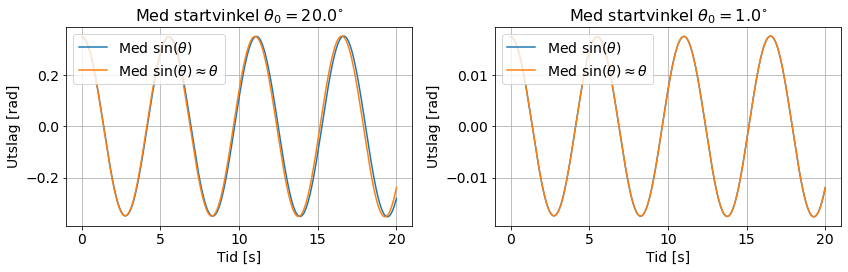

In [8]:
def f_approx(t, w):
    theta, omega = w[0], w[1]

    d_theta = omega
    d_omega = -F_B_constant*h_MC*theta/I_C

    dw = np.array([d_theta, d_omega])
    return dw

### Plot below ###

h = 1.e-3

theta0, omega0 = np.radians(20), 0
w0 = np.array([theta0, omega0]) #initial displacement and angular velocity    

t_array0, w_array0 = ODE_solver(t0, t_end, w0, f_fixedC, h, euler_step)
t_array_approx0, w_array_approx0 = ODE_solver(t0, t_end, w0, f_approx, h, euler_step)

theta1, omega1 = np.radians(1), 0
w1 = np.array([theta1, omega1]) #initial displacement and angular velocity

t_array1, w_array1 = ODE_solver(t0, t_end, w1, f_fixedC, h, euler_step)
t_array_approx1, w_array_approx1 = ODE_solver(t0, t_end, w1, f_approx, h, euler_step)

plt.figure(figsize=(12,4))
plt.subplot(121)
plt.title("Med startvinkel " + r"$\theta_0=$" + f"{np.rad2deg(theta0):.3}" + r"$^{\circ}$")
plt.plot(t_array0, w_array0[:,0], label =  r"Med $\sin(\theta)$")
plt.plot(t_array_approx0, w_array_approx0[:,0], label = r"Med $\sin(\theta) \approx \theta$")
plt.xlabel("Tid [s]")
plt.ylabel("Utslag [rad]")
plt.grid()
plt.legend(loc=2)

plt.subplot(122)
plt.title("Med startvinkel " + r"$\theta_0=$" + f"{np.rad2deg(theta1):.3}" + r"$^{\circ}$")
plt.plot(t_array1, w_array1[:,0], label = r"Med $\sin(\theta)$")
plt.plot(t_array_approx1, w_array_approx1[:,0], label = r"Med $\sin(\theta) \approx \theta$")
plt.xlabel("Tid [s]")
plt.ylabel("Utslag [rad]")
plt.grid()
plt.legend(loc=2)
plt.tight_layout()
plt.show()

Her har vi brukt samme $h$ som vi tidligere så at ga fysisk akseptable resultater, $h=0.001$. Fra plottene for utslaget ved forskjellige initial-utslag, er det tydelig at approksimasjonen holder godt for små vinkler, som $1\degree$, men bryter mer sammen når vi nærmer oss $20\degree$. Vi får fortsatt fysisk logiske resultater, men vi ser et avvik mellom det tilnærmede og reelle tilfellet. Amplitudene er konstante, og tilnærmet like, men det tilnærmede tilfellet har en marginalt kortere periode. Det vil videre i prosjektet ikke være aktuelt med startvinkler mye større enn $20\degree$, fordi dette vil bety at skipet har kantret fra start, og vi ser derfor ikke nærmere på dette. Vi velger imidlertid å gå bort fra approksimasjonen, for å unngå eventuelle avvik, og det forenkler ikke problemene vi må løse nevneverdig. 

For å løse disse problemene, må vi hente frem den matematiske verktøykassa vår. Eulers metode er nemlig  ikke det eneste verktøyet vi har for å løse ordinære differensiallikninger. Vi har også kjennskap til andre metoder av Runge Kutta-familien, som gjerne er høyere ordens metoder. Videre vil vi se på løsning av denne likninga ved en Runge Kutta metode, Runge-Kutta 4, og sammenligne den med Eulers metode og analytisk løsning, for å se hvor mye vi tjener på å bruke denne metoden. Her forventer vi å få mindre feil og at vi får raskere konvergens, altså at vi trenger færre steg for et gitt presisjonsnivå, sammenlignet med Eulers metode. 

In [9]:
def RK4_step(f, t_n, w_n, h):

    #Definition of constants used in the calculations
    k1 = f(t_n, w_n)
    k2 = f(t_n + h/2, w_n + h*k1/2) 
    k3 = f(t_n + h/2, w_n + h *k2/2)
    k4 = f(t_n + h,   w_n + h * k3)

    #Which gives us the following value for our next w

    t_next = t_n + h
    w_next = w_n + (h/6)*(k1 + 2*k2 + 2*k3 + k4)

    return t_next, w_next

**Analytisk løsning**

Hvis vi går tilbake til vår andreordens differensiallikning, og setter $F_Bh/I_C = \omega_H^2$ får vi

$\ddot\theta - \omega_H^2 \theta = 0$

Løser karakteristisk likning

$\lambda^2 - \omega_H^2 = 0$

$\lambda = \pm i\omega_H$

Som gir oss generell løsning

$\theta (t) = c_1\cos(\omega_Ht)+c_2 \sin(\omega_Ht)$

$\omega (t) = \dot \theta (t) = - \omega_H c_1 \sin(\omega_Ht) + \omega_H c_2 \cos(Kt)$

der $c_1, c_2$ er konstanter bestemt ut ifra initialbetingelsene

$\theta (0) = c_1$

$\omega (0) = \omega_H c_2 \qquad \Rightarrow 
\qquad c_1 = \theta_0, \quad c_2 = \omega_0/\omega_H$

Altså har vi generelt 

$\theta (t) = \theta_0 \cos(\omega_Ht)+ \frac{\omega_0}{K} \sin(\omega_Ht)$

$\omega (t) = - \omega_H \theta_0 \sin(\omega_Ht) + \omega_0 \cos(\omega_Ht), \qquad \omega_H = \sqrt{F_Bh/I_C}$

For å finne ordenen til de ulike metodene, har vi sett på verdiene vi får for $\theta(t=20)$, med startverdier $\theta_0=0.01$ rad og $\omega_0 = 0$ rad/s. Feilen i metoden finnes så ved å se på differansen mellom den analytiske løsningen og den numeriske løsningen (der vi for begge har brukt småvinkelapproksimasjonen $\sin (\theta) \rightarrow \theta$ ).

Vi antar da at feilen vil være på formen

$e(h)\leq C h^p$

der $C$ er en proporsjonalitetskonstant, $h$ er steglengden og $p$ er ordenen til metoden.

For å kunne finne ordenen til metodene, har vi tatt logaritmen av begge sider, og deretter gjort en lineær regresjonsanalyse.

$\log(e) = p \log(h) + \log(C) = p \log(h) + C'$

Dermed vil stigningstallet fra regresjonsanalysen være et estimat for ordenen til metoden.

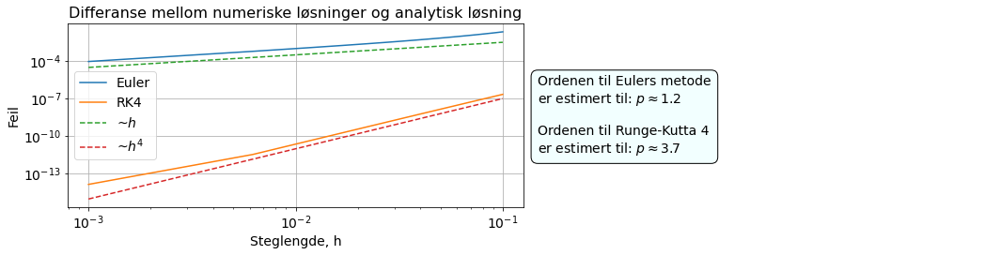

In [10]:
def analytic_solution(t, w0): #analytic solution using small angle approximation
    theta0, omega0 = w0[0], w0[1]
    omega_H=np.sqrt(F_B_constant*h_MC/I_C)

    theta = theta0 * np.cos(omega_H*t) + omega0/omega_H * np.sin(omega_H*t)
    omega = - omega_H * theta0 * np.sin(omega_H*t) + omega0 * np.cos(omega_H*t)

    w = np.c_[theta, omega]
    return w 

# We now want to see how different choice of h affect the error in our numerical solutions at t=20.

### Plot below ###

number_of_points = 20

h_array = np.linspace(1e-3, 1e-1, number_of_points, endpoint=True)

theta0 = 0.01
omega0 = 0

t0, t_end = 0, 20

w0 = np.array([theta0, omega0]) #Initial values

error_euler_array = np.array([]) # Array for storing the value of the error for theta with Euler's method
error_RK4_array = np.array([]) #Corresponding array for RK4

analytic_value = analytic_solution(t_end, w0)[:,0][-1] # The analytical value for theta at t = 20s.

for i in range(len(h_array)):
    t_array_step_euler, euler_values_step = ODE_solver(t0, t_end, w0, f_approx, h_array[i], euler_step)
    error_euler = np.abs(euler_values_step[-1][0]-analytic_value) 
    error_euler_array = np.append(error_euler_array, error_euler)

    t_array_step_RK4, RK4_values_step = ODE_solver(t0, t_end, w0, f_approx, h_array[i], RK4_step)
    error_RK4 = np.abs(RK4_values_step[-1][0]-analytic_value) 
    error_RK4_array = np.append(error_RK4_array, error_RK4)

def linear_fit(x,m,c):
    return m*x + c

params_euler, covariance_euler = curve_fit(linear_fit, np.log(h_array), np.log(error_euler_array))
params_RK4, covariance_RK4 = curve_fit(linear_fit, np.log(h_array), np.log(error_RK4_array))

#Plot

plt.figure()
plt.subplot(121)
plt.title("Differanse mellom numeriske løsninger og analytisk løsning")
plt.yscale("log")
plt.xscale("log")
plt.plot(h_array, error_euler_array, label = "Euler")
plt.plot(h_array, error_RK4_array, label = "RK4")
plt.plot(h_array, 3.e-2*h_array, '--', label = r"~$h$")
plt.plot(h_array, 1.e-3*h_array**4, '--', label = r"~$h^4$")
plt.grid()
plt.xlabel("Steglengde, h")
plt.ylabel("Feil")
plt.legend()
plt.subplot(122)
plt.text(0, 0.3, f"Ordenen til Eulers metode\ner estimert til: " + r"$p \approx$" + f"{params_euler[0]:.2}\n\n"+
                 f"Ordenen til Runge-Kutta 4\ner estimert til: "+ r"$p \approx$" + f"{params_RK4[0]:.2}", size=14, bbox=dict(boxstyle="round, pad=0.5",fc=(0.95, 1, 1)))
plt.axis("off")
plt.tight_layout()
plt.show()

I figuren over har vi plottet feilen mellom den siste verdien fra en numerisk metode og den analytiske løsningen. Aksene er logaritmiske, for å kunne illustrere ordenen lettere, som nevnt tidligere.
Det er også inkludert to stiplede linjer, som illustrerer det stigningstallet vi forventer fra de ulike metodene.

Fra tidligere vet vi at ordenen til Eulers metode er $p=1$, og at ordenen til Runge-Kutta 4 er $p=4$. Vi ser at approksimasjonene gir verdier for ordenene som er svært nære det vi forventer, og at de respektive linjene er tilnærmet parallelle. Vi kan ikke forvente at approksimasjonen gir verdier som er eksakte, da feilen kun skal være *mindre eller lik* $Ch^p$, og ikke *eksakt lik*.

Vi kan også observere at stigningstallet for RK4 er mindre enn det vi forventer ved de aller minste steglengdene. For en steglengde på $h=10^{-3}$ ser vi likevel at feilen kun er i en størrelsesorden på $10^{-14}$, slik at vi for alle praktiske formål kan regne feilen som ~$0$. Ettersom feilen er såpass lav for de minste steglengdene, er det unaturlig å få en like markant forbedring ved å minske steglengden. 

I realiteten er det vi har jobbet med til nå en svært forenklet modell. Vi vil imidlertid ikke utvikle modellen såpass at vi tar hensyn til fluidmekanikk, da dette er altfor vanskelig, men vi skal nå også ta hensyn til friksjonskrefter og drivkrefter forårsaket av bølger. Dermed får vi flere kraftbidrag som vil påvirke rotasjonen og også forårsake translatorisk bevegelse av massesenteret. Denne bevegelsen vil få mengden fortrengt vann til å variere, og derfor starter vi nettopp med å implementere muligheten for endring i $A$, før vi senere inkluderer andre krefter, som friksjon og bølger. Formelen for arealet av det fortrengte vannet vil nå være

$A=\frac{1}{2}R^2(\gamma-\sin(\gamma))$, med

$\gamma = 2 \arccos \left[\frac{1}{2}\cos(\beta)-\frac{4}{3\pi}(1-\cos(\theta))+\frac{\Delta y_C}{R} \right]$

der sektorvinkelen nå er $\gamma(t)$, ettersom vi nå ikke kun ser på likevektstilfellet. Ved introduksjonen av $\gamma$ introduserte vi også en til nå ukjent størrelse, $\Delta y_C$. Denne er definert som høydeforskjellen mellom massesenteret ved ei gitt tid, og dets posisjon i likevekt.

$\Delta y_C = y_C - y_C^0$

Med variasjon i mengden vann fortrengt, vil vi også få en varierende oppdriftskraft, siden disse størrelsene er proporsjonale. Vi vil fortsatt bruke vektoren $\vec{w}$, som inneholder løsningene for variablene vi er interesserte i. Dette vil være $\theta$ og $\omega$ som tidligere, men også massesenterets posisjon og fart. Dermed blir vektoren vår

$\vec{w}(t) = [\theta, \omega, x, y, v_x, v_y]^T$

Nå må vi også oppdatere vektorfunksjonen vår $\vec{f}(t, \vec{w})$, for å ta hensyn til at vi lar A variere og vår nye $\vec{w}$. I vår nye situasjon vil vi ikke bare kunne ta hensyn til summen av dreiemomenter, men også summen av krefter. Denne summen har bare y-komponenter, og blir som følger

$m\dot v_y=\sum F_y =  -F_g + F_B(\gamma)  = -mg + A(\gamma)\sigma_0g$

Samtidig får vi bare en liten oppdatering av summen for dreiemomenter, fordi angrepspunktet til oppdriftskrafta nå kan variere. Dermed vil armen variere, samtidig som selve absoluttverdien til krafta vil variere med det varierende arealet av det fortrengte vannet.

$I_C \dot\omega =\sum \tau_C = \tau_B =  -F_B(\gamma) h_{MC}\sin(\theta)$

Dermed blir vektorfunksjonen vår

$\vec{f}(t, \vec{w})= 
\begin{bmatrix}
\omega \\
-F_B(\gamma)h_{MC}\sin(\theta)/I_C \\
v_x \\
v_y \\
0 \\
-g+F_B(\gamma)/m
\end{bmatrix}$

In [11]:
def gamma(theta, delta_yC): #Function to calculate the sector angle
    return 2*np.arccos(np.cos(beta/2)-4/(3*np.pi)*(1-np.cos(theta))+ delta_yC/R)


def F_B(gamma): #We now introduce a function to calculate the magnitude of the buoyant force, as it will now vary
    water_displaced = 1/2*R**2*(gamma-np.sin(gamma))
    return water_displaced*density_water*g

def f_varyingA(t, w):
    theta, omega, x, y, v_x, v_y = w[0], w[1], w[2], w[3], w[4], w[5]
    
    delta_yC = y - y_C0 # = y_C - y_C0
    sector = gamma(theta, delta_yC)

    d_theta = omega
    d_omega = -F_B(sector)*h_MC*np.sin(theta)/I_C
    dx = v_x 
    dy = v_y
    dvx = 0 
    dvy = -g + F_B(sector)/m

    dw = np.array([d_theta, d_omega, dx, dy, dvx, dvy])
    return dw

Når vi nå har implementert muligheten for å la mengden fortrengt vann variere, vil vi nå gå bort fra tilnærmelsen vi tidligere har brukt med fiksert massesenter. Da er vi først spesielt interesserte i hvordan høyden til massesenteret vil variere, idet båten ligger og dupper i vannet. Dette vil vi så sammenligne med tilnærmelsen vi gjorde tidligere, altså å ha et fiksert massesenter.  

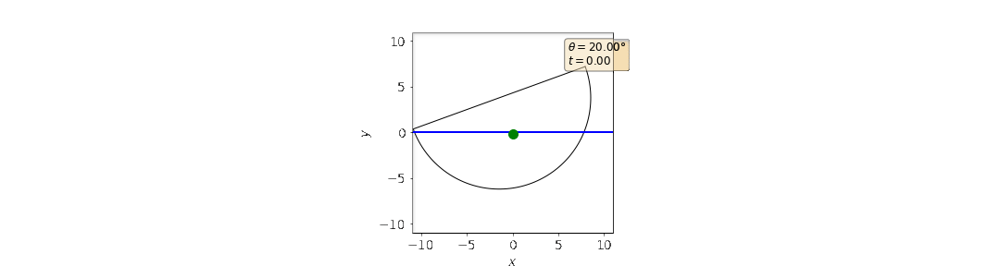

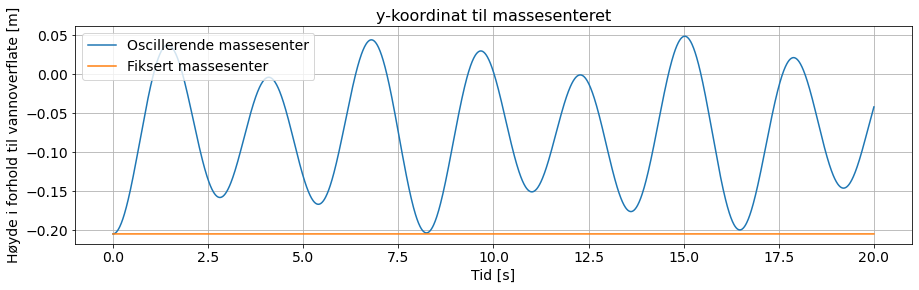

In [12]:
t0, t_end = 0, 20

theta0, omega0 = np.radians(20), 0
x0, y0 = 0, y_C0
vx0, vy0 = 0, 0
w0 = np.array([theta0, omega0, x0, y0, vx0, vy0]) #initial values

h0 = 0.01

t_array0, w_array0 = ODE_solver(t0, t_end, w0, f_varyingA, h0, RK4_step)

t = t_array0
theta = w_array0[:,0]
x_C = w_array0[:,2]
y_C = w_array0[:,3]

### Plot below ###

animate_deck_movement(t, theta, x_C, y_C, filename='duppebevegelse.gif')
with open('duppebevegelse.gif','rb') as file:
    display(Image(file.read()))

plt.figure()
plt.title("y-koordinat til massesenteret")
plt.plot(t_array0, y_C, label = "Oscillerende massesenter")
plt.plot(t_array0, np.full_like(t_array0, y_C0), label = "Fiksert massesenter")
plt.xlabel("Tid [s]")
plt.ylabel("Høyde i forhold til vannoverflate [m]")
plt.legend()
plt.grid()
plt.show()

Fra animasjonen ovenfor virker det som at det er ganske liten variasjon i høyden til massesenteret. Den virker til og med ganske lik den tidligere animasjonen som ble presentert. Dermed virker det ved første øyekast som en grei tilnærmelse å holde $A$ konstant. Dette gjelder imidlertid bare til man tar et nytt blikk, og ser at plottet av massesenterets høyde forteller en annen historie. Her er det tydelig at å neglisjere massesenterets duppebevegelser kan være en grov tilnærming. På det meste har massesenteret steget rundt 25 cm, fra en starthøyde på omtrent 20 cm under vann. Ved å ikke la $A$ variere fikserer vi $y_C$ til $y_C^0$, og vi mister altså massesenterets oscillerende natur. Vi gjør da altså en maksimal relativ feil i $y_C$ på cirka:

$\frac{25}{20}\cdot100\%=125\%$

Denne feilen er imidlertid situasjons-avhengig, og ved for eksempel små startutslag og -vinkelhastigheter, vil feilen minke. Dermed vil også modellantakelsen om  et konstant areal for det fortrengte vannet bli bedre. Når vi nå beveger oss inn i mer urolige farvann, vil vi derfor heller basere oss på et varierende areal. 

I disse farvannene er det videre også en fare for å kantre. For å implementere dette i modellen vår velger vi å oppdatere funksjonen vi bruker for å løse differensiallikningene, ODE_solver. Da beholder vi det meste av koden, men inkluderer nå muligheten for å behandle vektoren vår $\vec{w}$ på en bestemt måte, gitt at kantring inntreffer. I dette tilfellet settes alle komponenter av vektoren lik null for alle senere steg, mens utslaget settes til å være lik 90$\degree$  mot siden skipet kantrer til. Betingelsen vi har gitt for at kantring inntreffer, er at dekket kommer i kontakt med vannoverflata, som vil skje for utslag som oppfyller ulikheta 

$\theta > \frac{\pi-\gamma}{2}$

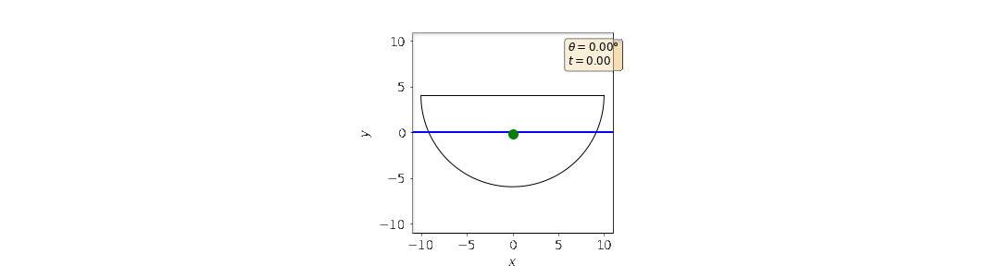

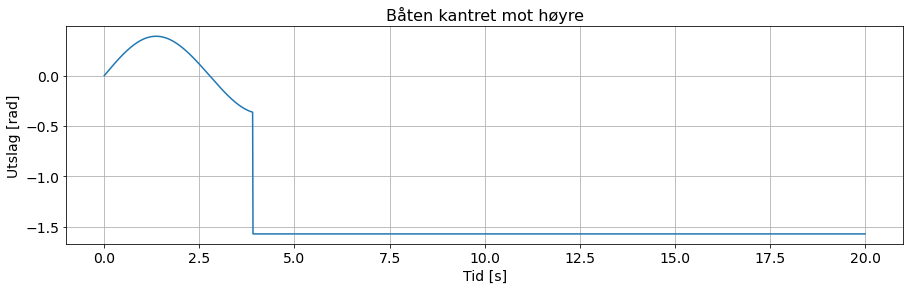

In [13]:
# Here we have used our original ODE_solver. We have used red lines to mark chunks of code that differ from
# previously presented code, and used comments to explain single lines of new code. This method of highlighting 
# new code in reused functions will be used throughout the project, 
# to make it clear what differs between parent- and child-functions. 

def ODE_solver_with_capsize(t0, t_end, w0, f, h, method):    
    w_array = np.array([w0])
    t_array = np.array(t0)
    t = t0
    w = w0
    capsize = False # Boolean variable used to check if the ship capsizes
    while t < t_end:
        if t + h > t_end:
            h = t_end - t
        """New code below"""
        if not capsize:
            theta = w[0]
            delta_yC = w[3]-y_C0
            capsize = abs(theta) > (np.pi-gamma(theta, delta_yC))/2 
        #We take the absolute value  of theta in order to ensure that we catch the capsizing to the right as well
        if capsize:
            t += h
            w = np.zeros(len(w0))
            w[0] = np.sign(w_array[-1][0])*np.pi/2 #We update theta to be sign(last angle) * pi/2 and all other
            #values of w is set to zero
            """New code above"""
        else:
            t, w = method(f, t, w, h)
        w_array = np.vstack((w_array, w))
        t_array = np.append(t_array, t)
        
    return t_array, w_array, capsize #We here return capsize as well, so that we can check if the ship capsizes
    # in a given simulation

### Plot below ###

t0, t_end = 0, 20

theta0, omega0 = np.radians(0), 0.45
x0, y0 = 0, y_C0
vx0, vy0 = 0, 0
w0 = np.array([theta0, omega0, x0, y0, vx0, vy0]) #initial values

h = 0.01
    
t_array0, w_array0, capsize = ODE_solver_with_capsize(t0, t_end, w0, f_varyingA, h, RK4_step)

t = t_array0
theta = w_array0[:,0]
x_C = w_array0[:,2]
y_C = w_array0[:,3]

animate_deck_movement(t, theta, x_C, y_C, filename='kantre.gif')
with open('kantre.gif','rb') as file:
    display(Image(file.read()))

#Code used in our plots for showing which side the boat capsizes towards

if capsize:
    if theta[-1]>0:
        title = "Båten kantret mot venstre"
    else:
        title = "Båten kantret mot høyre"
else:
    title = "Båten kantrer ikke"

plt.figure()
plt.title(title)
plt.plot(t_array0, theta)
plt.xlabel("Tid [s]")
plt.ylabel("Utslag [rad]")
plt.grid()
plt.show()

I animasjonen over ser vi at skipet kantrer, og det havner på siden det kantrer til. Dette kommer tydelig fram fra plottet, hvor vi ser en klar diskontinuitet idet utslaget tilsynelatende hopper fra $-0.4$ rad til $-\pi/2$ rad. Fortegnet viser her til at skipet kantrer mot høyre. Nå kan vi bruke vår nye funksjonalitet til å undersøke skips stabilitet i forhold til hverandre. Da velger vi å se på tilfeller med $\theta_0 = 0$, og vil finne den minste $\omega_0$ som kan få skipet til å kantre. Denne størrelsen kaller vi $\omega_k$, og dens verdi kan så knyttes til et skips stabilitet, ved at en høyere $\omega_k$ generelt vil bety et mer stabilt skip. 

Her baserte vi oss på intervallhalveringsmetoden for løsning av skalare likninger. Algoritmen baserer seg i hovedsak på ideen om at hvis en kontinuerlig funksjon skifter fortegn på et intervall, må den ha minst et nullpunkt på samme intervall. Nå har vi ingen likning å basere oss på, men vi antar nå at det finnes en slik $\omega_k$ som vi er ute etter. Denne vil være et grensetilfelle, hvor alle $\omega_0$ med absoluttverdi mindre enn denne ikke gir kantring, mens alle med større absoluttverdi gir det. Dette oppsummeres i figuren under.

![Picture title](omegak.png)

Vi velger nå to verdier for startvinkelhastigheta, $\omega_a$ og $\omega_b$. Vi undersøker først om $\omega_a$ og $\omega_b$ vil gi et forskjellig resultat, slik at vi vet at verdien for $\omega_k$ må ligge i dette intervallet. For hvert steg i algoritmen finner vi så gjennomsnittet av disse, $\omega_c$, og undersøker om vi får kantring ved denne verdien. Vi ser nå på intervallene $[\omega_a, \omega_c]$ og $[\omega_c, \omega_b]$, og fortsetter så med det intervallet der vi har kantring i ett endepunkt, men ikke i det andre. Dette gjøres frem til lengden på intervallet er blitt mindre enn en gitt toleranse, eller vi når en gitt grense for antall iterasjoner.

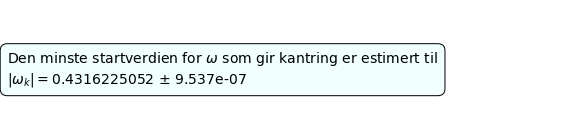

In [14]:
t0, t_end = 0, 20

theta0, omega0 = np.radians(0), 0
x0, y0 = 0, y_C0
vx0, vy0 = 0, 0
w0 = np.array([theta0, omega0, x0, y0, vx0, vy0]) #initial values

def bisection(w0, omegaA, omegaB,  f, ODE_method, step_method = RK4_step, tol=1.e-6, max_iter = 100):
    wA, wB = np.copy(w0), np.copy(w0)
    wA[1], wB[1] = omegaA, omegaB
    capsizeA = ODE_method(t0, t_end, wA, f, h0, step_method)[2] #Boolean value that tells us if the boat has capsized
    # with our lowest angular frequency

    capsizeB = ODE_method(t0, t_end, wB, f, h0, step_method)[2] #Boolean value that tells us if the boat has capsized
    # with our highest angular frequency

    assert capsizeA != capsizeB, 'The ship either capsizes for all values in the interval or none of them' #This is 
    #the boolean equivalent to asserting that f(a)*f(b) < 0 in a standard numerical bisection method

    for k in range(max_iter):
        omegaC = (omegaA+omegaB)/2 #Midpoint between omegaA and omegaB
        wC = np.copy(w0)
        wC[1] = omegaC
        capsizeC = ODE_method(t0, t_end, wC, f, h0, step_method)[2]

        interval_length = abs(omegaB-omegaA)
        if interval_length < 2*tol:     #Our interval is smaller than the tolerance
            break 
        elif capsizeA != capsizeC:               
            omegaB = omegaC             #The smallest capsize value is in the interval [omegaA, omegaC]
        else:
            omegaA = omegaC             #The smallest capsize value is in the interval [omegaC, omegaB]

    return omegaC, k, interval_length/2

omega_min, num_iter, error = bisection(w0, 0, 1, f_varyingA, ODE_solver_with_capsize)

plt.figure(figsize=(10,2))
plt.text(0, 0.3, r"Den minste startverdien for $\omega$ som gir kantring er estimert til" + f"\n"
               + r"$|\omega_k|=$"+ f"{omega_min:.10} "+r"$\pm$" + f" {error:.4}", size=14, bbox=dict(boxstyle="round, pad=0.5",fc=(0.95, 1, 1)))
plt.axis("off")
plt.show()

Til nå har vi forholdt oss til tomme skip, og sett helt bort fra muligheten for at skipet har bevegelig last eller passasjerer om bord. Å se bort fra dette er ikke særlig relevant i situasjonene vi nevnte innledningsvis, som fisketurer eller oppdagelsesreiser. På slike turer er det mye som må ordnes, og det er fort gjort å hoppe over et steg i en lang rutine. Da kan man for eksempel være så uheldig å glemme å feste lasten, og da er det ikke lett å si hva som skjer. Videre vil vi derfor nå implementere muligheten for løs last på skipet, og se hvordan dette påvirker dets dynamikk. Med last vil systemets masse endre seg, og vi vil derfor måtte beregne noen likevektsstørrelser på nytt. Vi velger å se på skipets last som en punktpartikkel, slik at systemets tverrsnittsareal forblir konstant, men systemets massen har økt tilsvarende lastens masse.

Arealet av det fortrengte vannet i likevekt er heller ikke det samme som tidligere. Dette kan finnes basert på det faktum at vi har ei likevekt, altså er 

$\sum F  = 0= F_B-F_g \Rightarrow F_B = F_g\Rightarrow A_0 = m_{tot}/\sigma_0$

Arealet selv kan imidlertid uttrykkes på samme måte som før, som gir oss følgende likning for likevektsvinkelen $\beta$

$\frac{1}{2}R^2(\beta-\sin\beta)=m_{tot}/\sigma_0$

$0 = \beta-\sin \beta - \frac{2m_{tot}}{\sigma_0R^2}$

Dette gjenkjenner vi som en implisitt likning, veldig lik den vi løste tidligere i prosjektet. Vi bruker derfor samme fremgangsmåte, men bruker nå bare Newtons metode, da den konvergerer raskere.

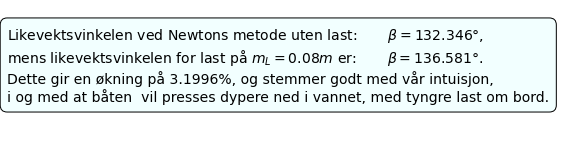

In [15]:
# Some new or redefined equilibrium constants

def beta_func(beta):
    return beta-np.sin(beta) - 2*m_tot/(density_water*R**2)

#Function we call whenever we want to recalculate the three equilibrium-values, beta, A_0 and y_C^0
def new_equilibrium_constants(m_L):
    global m_tot, A_0, y_C0, beta #Updating the global variables

    m_tot = m + m_L

    beta_guess = 2 #We will use beta=2 as our initial guess for the value of beta
    beta, number_of_iterations = fixed_point_solver(beta_func, df, beta_guess, 1.E-5, 1000)

    A_0 = m_tot/density_water

    y_M0_new = R*np.cos(beta/2)
    y_C0 = y_M0_new - h_MC

m_L = 0*m
new_equilibrium_constants(m_L)

beta_original = np.degrees(beta)

m_L = 0.08*m

new_equilibrium_constants(m_L)

beta_new = np.degrees(beta)

change_beta = abs((beta_original-beta_new)/beta_original)*100

plt.figure(figsize=(10,2.5))
plt.text(0, 0.3, r"Likevektsvinkelen ved Newtons metode uten last:       $\beta=$" + f"{beta_original:.6}" + r"$\degree$, " + "\n"
                +r"mens likevektsvinkelen for last på $m_L=0.08m$ er:       $\beta=$" + f"{beta_new:.6}" + r"$\degree$.  " + "\n" 
                "Dette gir en økning på " + f"{change_beta:.5}" + "%, og stemmer godt med vår intuisjon, " + "\n" 
                +"i og med at båten  vil presses dypere ned i vannet, med tyngre last om bord." 
                , size=14, bbox=dict(boxstyle="round, pad=0.5",fc=(0.95, 1, 1)))
plt.axis("off")
plt.show()

Med disse størrelsene i boks, er vi klar for å gyve løs på problemet med bevegelig last. Vi ser bare på lastens bevegelse relativt til metasenteret, og for å holde kompleksiteten på et håndterbart nivå har vi valgt å se bort fra friksjon mellom last og dekk. Dermed inkluderer vi nå størrelsene $s_L$, avstand til metasenteret,  og $v_L$ i $\vec{w}$ , og får følgende

$\vec{w}(t) = [\theta, \omega, x, y, v_x, v_y, s_L, v_L]^T$

Nå trenger vi også en ny vektorfunksjon, som tar hensyn til lasta. Her vil den generelle sammenhengen om at den deriverte av posisjon er hastighet, holde, mens kraft- og dreiemoment-summene endres. For dreiemomentet for skipet må vi for eksempel ta hensyn til at lastas tyngde vil gi følgende dreiemoment

$\tau_L = -m_Lg\cos\theta s_L$

Videre tar vi også hensyn til kontaktrefter mellom last og skip, som vil gi et lite bidrag til horisontal translatorisk bevegelse av skipet.  Denne krafta vil være x-komponenten av normalkrafta som skipet virker med på lasta, og er ifølge Newtons tredje lov


$F_L^x = m_L g \cos(\theta)\sin(\theta)$

og vi tar også med y-komponenten, som gir følgende bidrag til den vertikale bevegelsen

$F_L^y = - m_L g \cos^2(\theta) $

Til sist kan også lasta tenkes på som en kloss på et friksjonsfritt skråplan, med helningsvinkel lik skipets utslag. Dermed blir netto kraft som virker på lasta parallelt med skipets dekk

$F_{m_L} = -m_Lg\sin\theta$

Dermed får vi følgende vektorfunksjon for vårt nye system.

$\vec{f}(t, \vec{w})= 
\begin{bmatrix}
\omega \\
(-F_B(\gamma)h_{MC}\sin(\theta) - m_L g \cos(\theta) s_L)/I_C \\
v_x \\
v_y \\
m_L g \cos(\theta)\sin(\theta)/m \\
-g + F_B(\gamma)/m - m_L g \cos^2(\theta)/m\\
v_L\\
-g \sin(\theta)
\end{bmatrix}$

In [16]:
def f_with_cargo(t, w):
    theta, omega, x, y, v_x, v_y, s_L, v_L = w[0], w[1], w[2], w[3], w[4], w[5], w[6], w[7] 

    delta_yC = y - y_C0 # = y_C - y_C0
    sector = gamma(theta, delta_yC)

    d_theta = omega
    d_omega = (-F_B(sector)*h_MC*np.sin(theta) - m_L *g*np.cos(theta)*s_L)/I_C

    dx = v_x
    dy = v_y
    dvx = m_L*g*np.cos(theta)*np.sin(theta)/m
    dvy = -g + F_B(sector)/m - m_L*g*np.cos(theta)**2/m

    dsL = v_L
    dvL = - g*np.sin(theta)

    dw = np.array([d_theta, d_omega, dx, dy, dvx, dvy, dsL, dvL])

    return dw

Det er klart at modellen vår til nå har visse mangler. Det er hovedsakelig problematisk at vi ikke har gjort noe spesielt for tilfeller der  lasten forlater skipet, og det da vil fortsette å oppføre seg som at lasten er på. Dette vil vi nå endre, og da trenger vi  en ny ODE-løser, som vi kan bruke for denne $\vec{f}$-en. Da vil vi spesielt at når lasta forlater dekket, skal den ikke lenger påvirke skipets dynamikk. Dette gjøres ved å sette $m_L=0$. Vi har også valgt å plassere lasta langt borte fra skipet, mot den siden den detter av, samt å sette $v_L=0$. Her blir implementasjonen av koden litt lik det vi gjorde for kantring, altså at vi oppdatererer en funksjon,  ODE-solver, med nye krav inne i funksjonen. 

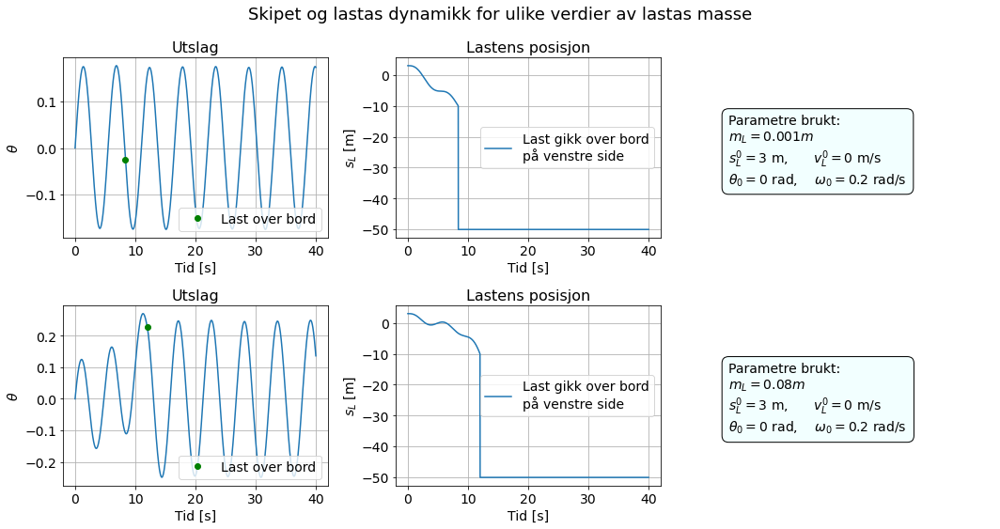

In [17]:
def ODE_solver_overboard(t0, t_end, w0, h, method):
    global m_L
    w_array = np.array([w0])
    t_array = np.array(t0)
    t = t0
    w = w0
    capsize = False
    overboard = np.abs(w[6]) > R #Criteria for losing the cargo.
    overboad_point = (t0, w[0]) # Gives us a way to record the time and value of theta at which the cargo leaves
    # the ship. This will just be at our starting point if the cargo never leaves 
    while t < t_end:
        if t + h > t_end:
            h = t_end - t
        """New code below"""
        # We have used the structure of Ode_solver_with_capsize, to ensure that the boat actually capsizes if it should do so,
        # even with cargo on board. 

        # We here check if the cargo has left the ship in the current step, given that it didn't do so in the last step.
        # This ensures that this part will only be run until the cargo actually leaves.
        if not overboard:
            overboard = np.abs(w[6]) > R #Checks if the cargo has left the deck
            if overboard:
            # Below, we set the cargo's mass to zero, given that it actually leaves the ship in the current step
            # and this is only done once, as the equilibrium constants only need to be updated once after the
            # cargo leaves the system. 
                m_L = 0
                new_equilibrium_constants(m_L) #Need to recalculate the equilibrium constants
                overboard_point = (t, w[0]) # Records the value of theta when the cargo leaves.

        """New code above"""
        if not capsize:
            theta = w[0]
            delta_yC = w[3]-y_C0
            capsize = abs(theta) > (np.pi-gamma(theta, delta_yC))/2
        if capsize:
            t += h
            w = np.zeros(len(w0))
            w[0] = np.sign(w_array[-1][0])*np.pi/2 
        else:
            t, w = method(f_with_cargo, t, w, h)

        """New code below"""
        if overboard: # Sets the position of the cargo to some point far from the ship, and its velocity to zero
            w[6], w[7] = 5*np.sign(w_array[-1][6])*R, 0
        """New code above"""
        
        w_array = np.vstack((w_array, w))
        t_array = np.append(t_array, t)
    
    return t_array, w_array, capsize, overboard_point # We now also return the point in time that the cargo leaves
    # the ship, and its theta at this time
    
### Plot below ###

#INITIAL VALUES 1

# This sets the equilibrium constants to certain values, depending on the situation we examine in the block.
# This will come in handy when we change the mass of the cargo, and we need the correct corresponding
# equilibrium values. 

m_L = 0.001*m
new_equilibrium_constants(m_L)

t0, t_end = 0, 40

theta0, omega0 = 0, 0.2
x0, y0 = 0, y_C0
vx0, vy0 = 0, 0
sL0, vL0 = 3, 0
w0 = np.array([theta0, omega0, x0, y0, vx0, vy0, sL0, vL0]) #initial values

h = 0.01
    
t_array, w_array, capsize, overboard_point = ODE_solver_overboard(t0, t_end, w0, h, RK4_step)

t = t_array
theta = w_array[:,0]
s_L = w_array[:,6]

#PLOT 1

if s_L[-1] > R:
    overboard_label = "Last gikk over bord\npå høyre side"
elif s_L[-1] < - R:
    overboard_label = "Last gikk over bord\npå venstre side"
else:
    overboard_label = "Last gikk ikke\nover bord"

plt.figure(figsize=(15,8))
plt.suptitle("Skipet og lastas dynamikk for ulike verdier av lastas masse")
plt.subplot(231)
plt.title("Utslag")
plt.plot(t_array, theta)
plt.plot(overboard_point[0], overboard_point[1], "o" , color = "green", label = "Last over bord")
plt.xlabel("Tid [s]")
plt.ylabel(r"$\theta$")
plt.legend(loc = 4)
plt.grid()

plt.subplot(232)
plt.title("Lastens posisjon")
plt.plot(t_array, s_L, label = overboard_label)
plt.xlabel("Tid [s]")
plt.ylabel(r"$s_L$ [m]")
plt.grid()
plt.legend(loc = 7)

plt.subplot(233)
plt.text(0, 0.3, f"Parametre brukt:\n" + r"$m_L = $" + r"$0.001m$"+"\n"
               + r"$s_L^0 = 3$ m, $\quad$  "+ r"$v_L^0 = 0$ m/s"+ "\n" 
               + r"$\theta_0 = 0 $ rad, $\quad$"+ r"$\omega_0 = 0.2 $ rad/s", size=14, bbox=dict(boxstyle="round, pad=0.5",fc=(0.95, 1, 1)))
plt.axis("off")

#INITIAL VALUES 2

m_L = 0.08*m
new_equilibrium_constants(m_L)

t0, t_end = 0, 40

theta0, omega0 = 0, 0.2
x0, y0 = 0, y_C0
vx0, vy0 = 0, 0
sL0, vL0 = 3, 0
w0 = np.array([theta0, omega0, x0, y0, vx0, vy0, sL0, vL0]) #initial values

h = 0.01
    
t_array, w_array, capsize, overboard_point = ODE_solver_overboard(t0, t_end, w0, h, RK4_step)

t = t_array
theta = w_array[:,0]
x_C = w_array[:,2]
y_C = w_array[:,3]
s_L = w_array[:,6]

#PLOT 2

if s_L[-1] > R:
    overboard_label = "Last gikk over bord\npå høyre side"
elif s_L[-1] < - R:
    overboard_label = "Last gikk over bord\npå venstre side"
else:
    overboard_label = "Last gikk ikke\nover bord"

plt.subplot(234)
plt.title("Utslag")
plt.plot(t_array, theta)
plt.plot(overboard_point[0], overboard_point[1], "o" , color = "green", label = "Last over bord")
plt.xlabel("Tid [s]")
plt.ylabel(r"$\theta$")
plt.legend(loc=4)
plt.grid()

plt.subplot(235)
plt.title("Lastens posisjon")
plt.plot(t_array, s_L, label = overboard_label)
plt.xlabel("Tid [s]")
plt.ylabel(r"$s_L$ [m]")
plt.grid()
plt.legend(loc=7)

plt.subplot(236)
plt.text(0, 0.3, f"Parametre brukt:\n" + r"$m_L = $" + r"$0.08m$"+ f"\n"
               + r"$s_L^0 = 3$ m, $\quad$  "+ r"$v_L^0 = 0$ m/s"+ "\n" 
               + r"$\theta_0 = 0 $ rad, $\quad$"+ r"$\omega_0 = 0.2 $ rad/s "
                , size=14, bbox=dict(boxstyle="round, pad=0.5",fc=(0.95, 1, 1)))
plt.axis("off")
plt.tight_layout()
plt.show()


Fra plottene ovenfor, ser vi at lastas masse er av stor betydning. For den mindre massen, på en promille av skipets masse, ser vi at utslaget er relativt likt, både før og etter lasta faller av. Dette er også ganske likt situasjonene vi har sett for skipet uten last tidligere, noe som intuitivt gir mening i og med at vi ser på en såpass relativ liten masse. For den tyngre lasta er dens effekt imidlertid langt klarere. Her ser vi at så lenge lasta holder seg på skipet, ser vi at skipet starter med små utslag fra side til side, men at utslagene øker mot den sida som lasta nærmer seg. I det lasta forlater skipet kommer vi så inn i en harmonisk bevegelse, med høyere amplitude enn vi startet med for skipet, men også enn for den med lavere masse.

Vi har også animert starten av bevegelsen for den tyngste lasta, som kan sees i animasjonen nedenfor.

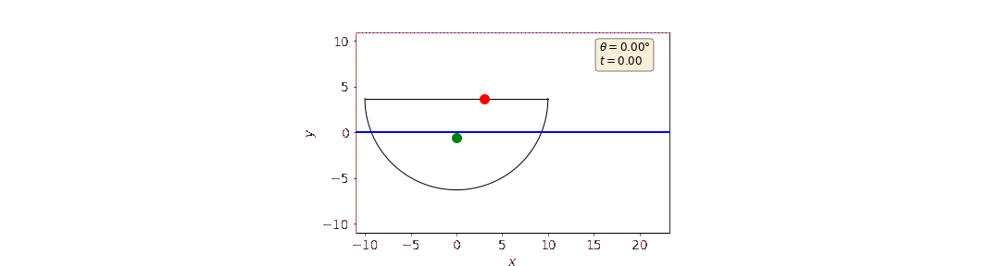

In [18]:
#ANIMATION

animate_deck_movement(t, theta, x_C, y_C, s_L, filename='cargooffdeck.gif')
with open('cargooffdeck.gif','rb') as file:
    display(Image(file.read()))

Fra animasjonen over legger vi merke til at vi nå også får en translatorisk bevegelse i x-retning, som vi ikke har sett tidligere. Denne bevegelsen er det ingen krefter som motvirker nå som lasta er borte, og derfor har vi også en lineær bevegelse, med konstant fart, som kan sees i plottet nedenfor. Dette er som forventet ut fra modellen, men er ikke særlig realistisk, da det vil bety at båten vil bevege seg med samme translatoriske fart for alltid. På samme måte vil svingebevegelsen fortsette for alltid, som også er veldig urealistisk. Derfor vil vi senere inkludere friksjonskrefter som virker for å eliminere svingebevegelsen, selv om det da ikke vil bli noe netto endring i translatorisk fart i x-retning.

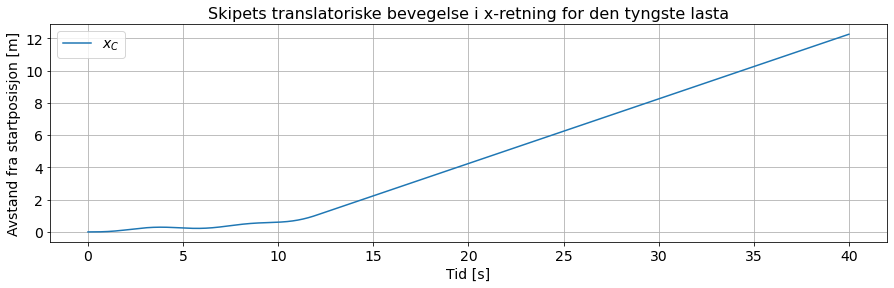

In [19]:
plt.figure()
plt.title("Skipets translatoriske bevegelse i x-retning for den tyngste lasta")
plt.plot(t_array, x_C, label = r"$x_C$")
plt.xlabel("Tid [s]")
plt.ylabel("Avstand fra startposisjon [m]")
plt.legend()
plt.grid()
plt.show()

Om det imidlertid er fangsten etter en fisketur eller gull man tar med hjem fra en oppdagelsesferd til Amerika, vil man gjerne ikke at den faller av skipet. Hvis man først er så uheldig at man har glemt å feste lasta, er det fint om man har en siste sikkerhetsmekanisme. Dette kan for eksempel være et gjerde, som fysisk stopper lasten. Her har vi valgt å forenkle dette litt, og se bort fra eventuell impuls som overføres fra last til gjerde ved en eventuell kollisjon. Dermed blir farten til lasta satt til null når den treffer gjerdet, og lasta låses også til gjerdet. Vi har derfor kalt dette for en "limgjerde"-modell. Å bruke "limgjerder" er gjort med et ønske om å undersøke effekten av en last på kanten av skipets dekk, men vi vil senere også la lasta bevege seg fritt på dekk.

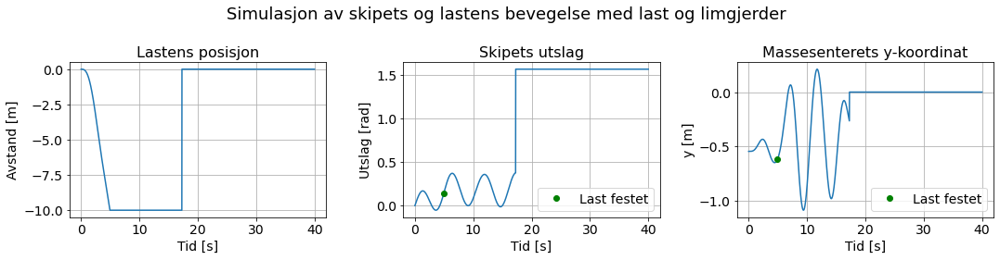

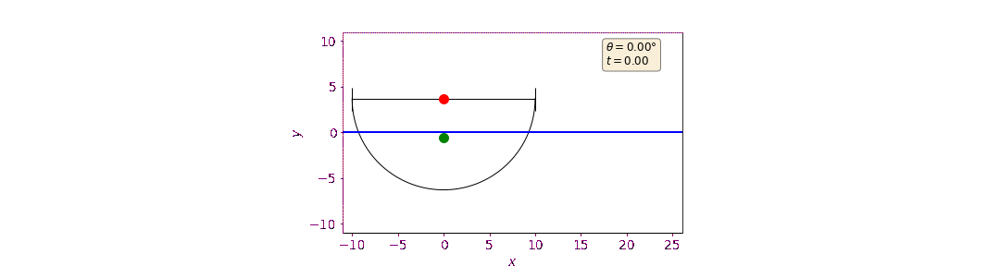

In [20]:
# This code is a development of our ODE_solver_overboard, and new chunks of code is marked by red lines, and 
# new single lines by #

def ODE_solver_with_gluefence(t0, t_end, w0, h, method):
    w_array = np.array([w0])
    t_array = np.array(t0)
    t = t0 # We record the values of our first point
    w = w0
    capsize = False
    glued = False # Boolean variable used to check if the cargo is glued to its fence
    glued_point = (t0, w[0]) # Gives us the time and value of theta at which the cargo is glued to the fence.
    # Analogous to overboard_point in ODE_solver_overboard
    while t < t_end: 
        if t + h > t_end:
            h = t_end - t
        if not capsize:
            theta = w[0]
            delta_yC = w[3]-y_C0
            capsize = abs(theta) > (np.pi-gamma(theta, delta_yC))/2
        if capsize:
            t += h
            w = np.zeros(len(w0))
            w[0] = np.sign(w_array[-1][0])*np.pi/2 
        else:
            t, w = method(f_with_cargo, t, w, h)
        """New code below"""
        overboard = np.abs(w[6]) > R #Criteria for losing the cargo.
        if overboard or glued: # When locking the cargos position to the edge of the deck, it will technically
        # no longer fulfill the requirements for being overboard. We therefore introduce the variable glued
        # to make sure that the cargo actually sticks to the fence.
            if not glued:
                glued_points = (t, w[0], w[3]) #Records the time at which the boat is glued to the fence
                glued = True 
            w[6]=np.sign(w[6])*R
            w[7]=0
        """New code above"""
        w_array = np.vstack((w_array, w))
        t_array = np.append(t_array, t)
        
    return t_array, w_array, capsize, glued_points


### Plot below ###

m_L = 0.08*m

new_equilibrium_constants(m_L)

t0, t_end = 0, 40

theta0, omega0 = np.radians(0), 0.2
x0, y0 = 0, y_C0
vx0, vy0 = 0, 0
sL0, vL0 = 0, 0
w0 = np.array([theta0, omega0, x0, y0, vx0, vy0, sL0, vL0]) #initial values

h0 = 0.01
    
t_array0, w_array0, capsize, glued_points = ODE_solver_with_gluefence(t0, t_end, w0, h0, RK4_step)

t = t_array0
theta = w_array0[:,0]
x_C = w_array0[:,2]
y_C = w_array0[:,3]
s_L = w_array0[:,6]


plt.figure()
plt.suptitle("Simulasjon av skipets og lastens bevegelse med last og limgjerder")
plt.subplot(131)
plt.title("Lastens posisjon")
plt.xlabel("Tid [s]")
plt.ylabel("Avstand [m]")
plt.plot(t_array0, s_L)
plt.grid()

plt.subplot(132)
plt.title("Skipets utslag")
plt.plot(t_array0, theta)
plt.plot(glued_points[0], glued_points[1], "o" , color = "green", label = "Last festet")
plt.xlabel("Tid [s]")
plt.ylabel("Utslag [rad]")
plt.legend(loc=4)
plt.grid()

plt.subplot(133)
plt.title("Massesenterets y-koordinat")
plt.plot(t_array0, y_C)
plt.plot(glued_points[0], glued_points[2], "o", color = "green", label = "Last festet")
plt.ylabel("y [m]")
plt.xlabel("Tid [s]")
plt.grid()
plt.legend(loc=4)
plt.tight_layout()
plt.show()

animate_deck_movement(t, theta, x_C, y_C, s_L, gjerde = True, filename='cargowithgluefences.gif')
with open('cargowithgluefences.gif','rb') as file:
    display(Image(file.read()))


Her ser vi at når lasta festes til et gjerde, får vi ei tydelig endring i utslaget. Båten vil da helle mer mot siden lasta er festet på, og mindre i motsatt retning. Dette kan forklares med at når lasta fikseres til den ene sida, vil armen i bidraget til dreiemomentet fra lasta holdes maksimal, lik $R$, og rotere skipet mot siden lasta er på. Med dissse større utslagene vil også massesenterets translatoriske bevegelse i y-retning påvirkes. Dette kan sees fra uttrykket:

$F_L^y = - m_L g \cos^2(\theta) $

Her  ser vi at vi for større $\theta$ vil få mindre krefter som presser båten ned, og oppdriftskrafta vil derfor dytte skipet høyt opp, før det så faller ned igjen fordi oppdriftskrafta minker når skipet dyttes opp. Med dette samspillet mellom tyngde og oppdrift, og en svakere effekt av lastas tyngde, får vi derfor klarere duppebevegelser enn tidligere. Videre er det en uheldig kombinasjon av skipets økte utslag, og dyp dupping, som gjør at det kantrer til slutt.  

Tidligere har vi sett at modellen vår kan gi noen litt ufysiske resultater, spesielt i forhold til skip som ikke kantrer. Da kan for eksempel skipet få en translatorisk bevegelse mot høyre, hvis lasten forlater skipet på venstre side. Denne bevegelsen vil fortsette i det uendelige, fordi det rett og slett ikke finnes krefter til å motvirke den. Derfor vil vi nå se på enkelte egenskaper ved vannet som fluid, og først ser vi på effekten av friksjon mellom vannet og skipet på skipets stabilitet. For å fokusere på dette, velger vi derfor å se bort fra last for nå. 

Som modell har vi her valgt oss ei friksjonskraft som virker for å motvirke skipets rotasjonsbevegelse. Denne virker i x-retninga, og forårsaker et bidrag til både dreimoment og kraftsummen. Dette vil bety at så lenge båten gjør utslag, vil også dens translatoriske fart påvirkes, men idet rotasjonen stopper, er det ikke lenger noen endring i x-retning. 

$f=-k_f R \gamma \omega, \qquad$ der $k_f$ er friksjonskoeffisienten

Dermed blir systemet vårt nå på formen

$\vec{f}(t, \vec{w})= 
\begin{bmatrix}
\omega \\
[-F_B(\gamma)h_{MC}\sin(\theta) + f(y-(R(\cos(\gamma/2)-1)))]/I_C \\
v_x \\
v_y \\
f/m \\
-g + F_B(\gamma)/m \\
\end{bmatrix}$

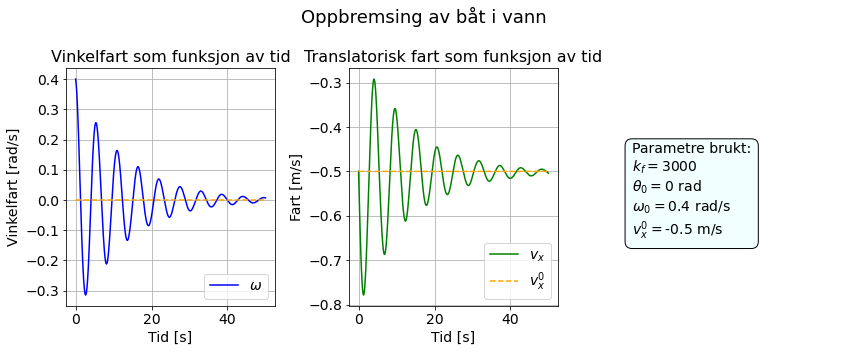

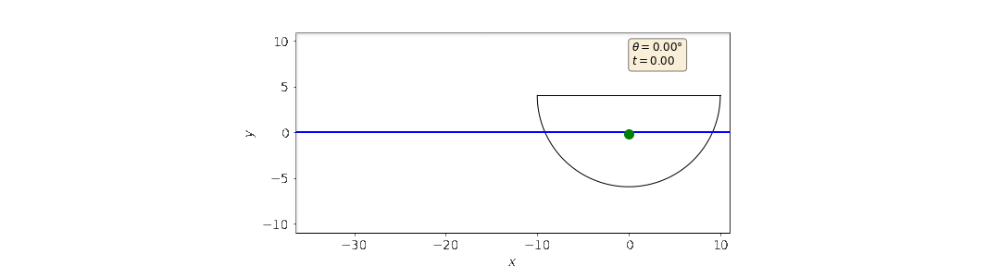

In [21]:
def f_with_friction(t, w):
    theta, omega, x, y, v_x, v_y= w[0], w[1], w[2], w[3], w[4], w[5]

    delta_yC = y - y_C0 # = y_C - y_C0
    sector = gamma(theta, delta_yC)

    f = -k_f*R*sector* omega

    d_theta = omega
    d_omega = (-F_B(sector)*h_MC*np.sin(theta) + f*(y-R*(np.cos(sector/2)-1)))/I_C
    dx = v_x
    dy = v_y
    dvx = f/m
    dvy = -g + F_B(sector)/m 

    dw = np.array([d_theta, d_omega, dx, dy, dvx, dvy])

    return dw

### Plot below ###

k_f = 3E3

m_L = 0

new_equilibrium_constants(m_L)

t0, t_end = 0, 50

theta0, omega0 = 0, 0.4
x0, y0 = 0, y_C0
vx0, vy0 = -0.5, 0

w0 = np.array([theta0, omega0, x0, y0, vx0, vy0]) #initial values

h = 0.01

t_array, w_array, capsize = ODE_solver_with_capsize(t0, t_end, w0, f_with_friction, h, RK4_step)

t = t_array

theta = w_array[:,0]
x_C = w_array[:, 2]
y_C = w_array[:, 3]

omega = w_array[:,1]

v_x = w_array[:,4]


plt.figure(figsize=(12,5))
plt.suptitle("Oppbremsing av båt i vann")
plt.subplot(131)
plt.title("Vinkelfart som funksjon av tid")
plt.plot(t, omega, label = r"$\omega$" , color='blue')
plt.plot(t, np.zeros_like(t), '--', color='orange')
plt.legend(loc=4)
plt.xlabel("Tid [s]")
plt.ylabel("Vinkelfart [rad/s]")
plt.grid()

plt.subplot(132)
plt.title("Translatorisk fart som funksjon av tid")
plt.plot(t, v_x, label = r"$v_x$" , color='green')
plt.plot(t, np.full_like(t, vx0),"--" , label = r"$v_{x}^0$", color = "orange")
plt.legend(loc=4)
plt.xlabel("Tid [s]")
plt.ylabel("Fart [m/s]")
plt.grid()

plt.subplot(133)
plt.text(0, 0.3, f"Parametre brukt:\n"
               + r"$k_f=$" + f"{k_f:4.0f}\n"
               + r"$\theta_0=$" + f"{theta0} rad\n"
               + r"$\omega_0 =$"+f"{omega0} rad/s\n"
               + r"$v_x^0=$" + f"{vx0} m/s", size=14, bbox=dict(boxstyle="round, pad=0.5",fc=(0.95, 1, 1)))
plt.axis("off")
plt.tight_layout()
plt.show()

animate_deck_movement(t, theta, x_C, y_C, filename='friction.gif')
with open('friction.gif','rb') as file:
    display(Image(file.read()))

Nå har vi sendt båten mot venstre med ei gitt startfart, og en viss vinkelhastighet. Friksjonskrafta vil gi et translatorisk bidrag i motsatt retning av rotasjonen, og dermed vil båten først akselereres mot ei større negativ fart. Etter at rotasjonen skifter retning vil vi derimot få deakselerasjon, og $\omega$ går mot null, mens vi ser at $v_x$ nærmer seg sin opprinnelige verdi. Friksjonskrafta virker her altså slik at den kan endre absoluttverdien til farta, men bare til rotasjonsbevegelsen er eliminert, og friksjonskrafta har dermed bare som netto effekt at rotasjonsbevegelsen slås ut. 

I arbeidet med denne animasjonen var det tydelig at valget av friksjonskoeffisient var av stor betydning. Derfor vil vi nå tilnærme oss dette på en mer systematisk måte, og velge koeffisienter av ulike størrelsesordener. Da velger vi $k_f$ fra $10^2$ til $10^5$, hvor vi øker koeffisienten med en faktor på ti for hvert steg. For hver av disse koeffisientene plotter vi utslaget som funksjon av tida over $40$ sekunder, og skal så se på effekten koeffisienten har på utslaget.

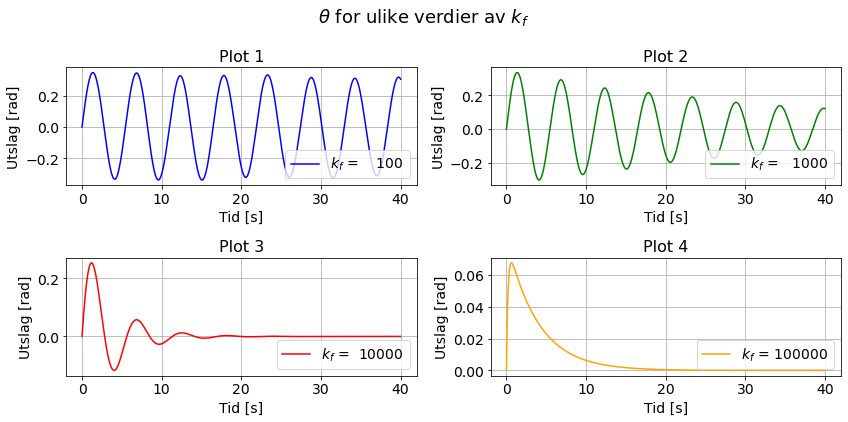

In [22]:
### Plot below ###

k_f_values = np.logspace(2, 5, 4)

t0, t_end = 0, 40

theta0, omega0 = np.radians(0), 0.4
x0, y0 = 0, y_C0
vx0, vy0 = 0, 0
w0 = np.array([theta0, omega0, x0, y0, vx0, vy0]) #initial values

h = 0.01

i = 1
color_list = ['blue', 'green', 'red', 'orange']
plt.figure(figsize=(12,6))
plt.suptitle(r"$\theta$ for ulike verdier av $k_f$")
for k_f in k_f_values:
    t_array0, w_array0, capsize = ODE_solver_with_capsize(t0, t_end, w0, f_with_friction, h, RK4_step)
    t = t_array0
    theta = w_array0[:,0]
    plt.subplot(2,2,i)
    plt.title(f"Plot {i}")
    plt.plot(t, theta, label = r"$k_f$" + f" = {k_f:6.0f}", color=color_list[i-1])
    plt.legend(loc=4)
    plt.xlabel("Tid [s]")
    plt.ylabel("Utslag [rad]")
    plt.grid()
    i+=1
plt.tight_layout()
plt.show()

For små $k_f$, som vist i plott 1 og 2, har vi situasjoner som ligner det vi har sett tidligere for utslaget, med en svak grad av demping. Her minker utslaget litt ved økende $t$, og det minker mer for større koeffisienter. Når $k_f$ nærmer seg $10^4$, ser vi også at vi kommer til en situasjon med underkritisk demping. Her har vi et svingesystem med svært raskt avtakende amplitude, som fort stabiliserer seg rundt 0, når dempekrafta har eliminert svingebevegelsen. Til sist får vi for vår største koeffisient en overkritisk dempet oscillator. Her gjør systemet egentlig ingen svingninger, det når sitt maksutslag, og så går bare utslaget sakte mot null, som vist i plot 4.

Det er imidlertid ikke bare friksjonskrafta vi kan ta hensyn til når vi tenker på hvordan vannet påvirker båten. Her ser vi igjen bort fra hvordan båten påvirker vannet, altså et meget forenklet hydrodynamisk problem. Dette innebærer at når vi nå vil undersøke effekten av bølger, velger vi den som ei harmonisk kraft som virker i horisontal retning, med angrepspunkt i skjæringspunktet mellom skipets skrog og vannlinja. Dermed kan vi skrive krafta fra bølgen på formen

$F_w = F_0 \cos (\omega_w t)$

Her er $F_0$, amplituden, en konstant vi velger for å skalere bidraget størrelsen på krafta, i forhold til de andre kreftene. Videre er $w_w \propto \omega_H$, hvor størrelsen $\omega_H = \sqrt {mgh/I_C}$ er vinkelfrekvensen til en harmonisk oscillator med småvinkelapproksimasjonen vi nevnte tidligere. 
Med valget vårt av angrepspunkt, vil denne krafta forårsake både et bidrag til kraft- og dreimemoment-summen, slik at vår oppdaterte vektorfunksjon for systemet blir

$\vec{f}(t, \vec{w})= 
\begin{bmatrix}
\omega \\
[-F_B(\gamma)h_{MC}\sin(\theta) + f(y-(R(\cos(\gamma/2)-1))) + F_w y]/I_C\\
v_x \\
v_y \\
[f + F_w]/m\\
-g + F_B(\gamma)/m
\end{bmatrix}$

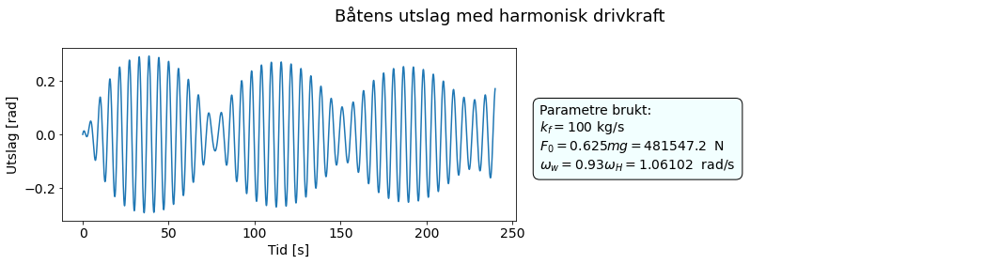

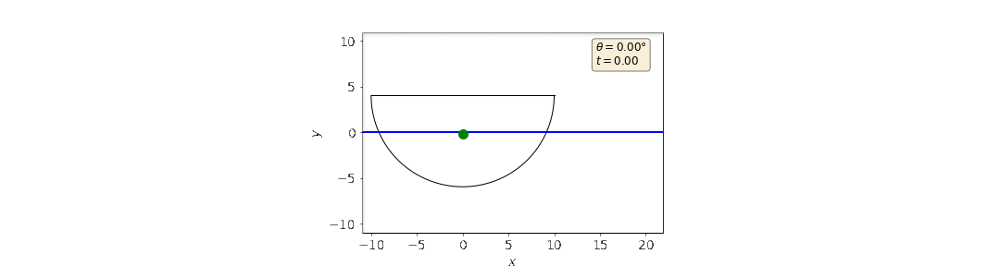

In [23]:
def f_with_waves(t, w):
    theta, omega, x, y, v_x, v_y= w[0], w[1], w[2], w[3], w[4], w[5]

    delta_yC = y - y_C0 # = y_C - y_C0
    sector = gamma(theta, delta_yC)

    f = -k_f*R*sector* omega
    F_w = F_0 * np.cos(omega_w*t)

    d_theta = omega
    d_omega = (-F_B(sector)*h_MC*np.sin(theta) + f*(y-R*(np.cos(sector/2)-1))+F_w*y)/I_C
    dx = v_x
    dy = v_y
    dvx = (f+F_w)/m
    dvy = -g + F_B(sector)/m 

    dw = np.array([d_theta, d_omega, dx, dy, dvx, dvy])

    return dw

### Plot below ###

m_L = 0
new_equilibrium_constants(m_L)

F_0 = 0.625*m*g
omega_H = np.sqrt(m*g*h_MC/I_C)
omega_w = 0.93*omega_H
k_f = 100

t0, t_end = 0, 240

theta0, omega0 = 0, np.radians(2)
x0, y0 = 0, y_C0
vx0, vy0 = 0, 0
w0 = np.array([theta0, omega0, x0, y0, vx0, vy0]) #initial values

h0 = 0.01
    
t_array0, w_array0, capsize = ODE_solver_with_capsize(t0, t_end, w0, f_with_waves, h0, RK4_step)

t = t_array0
theta = w_array0[:,0]
x_C = w_array0[:,2]
y_C = w_array0[:,3]

plt.figure(figsize = (15,4))
plt.suptitle("Båtens utslag med harmonisk drivkraft")
plt.subplot(121)
plt.plot(t_array0, theta)
plt.xlabel("Tid [s]")
plt.ylabel("Utslag [rad]")
plt.subplot(122)

F_0 = round(F_0, 1)
omega_w = round(omega_w, 5)
plt.text(0, 0.3, r"Parametre brukt:" + f"\n" + r"$k_f = $" + f"{k_f} kg/s \n"
               + r"$F_0=0.625mg = $"+  f"{F_0} " + " N \n" + r"$\omega_w = 0.93 \omega_H= $" + f"{omega_w} " 
               +" rad/s" , size=14, bbox=dict(boxstyle="round, pad=0.5",fc=(0.95, 1, 1)))
plt.axis("off")
plt.tight_layout()
plt.show()

animate_deck_movement(t, theta, x_C, y_C, filename='waves.gif')
with open('waves.gif','rb') as file:
    display(Image(file.read()))


For situasjonen ovenfor får vi spennende resultater for båtens utslag. Dette er et eksempel på svevning, der utslagene nå blir modulert av en omhyllingskurve. I praksis får vi da et fenomen som kan beskrives som at systemets svingninger selv svinger. Slik får vi periodiske "humper" i grafen vår. Innad i hver "hump" gjør båten større og større utslag, før den når en maksverdi, og så nærmer seg utgangspunktet igjen. Deretter vil det komme en hump som tar like lang tid å komme seg gjennom, samtidig som maksutslaget minkes. 

I siste del av prosjektet er vi interessert i å gå tilbake til modellen vår med løs last, og studere hvordan skipets stabilitet vil avhenge av økende masse på lasta. Vi vil i første omgang da returnere til et spesielt aspekt ved lasten som vi tidligere neglisjerte, nemlig muligheten til å flytte seg vekk fra gjerdet etter å ha kollidert. Her neglisjerer vi fremdeles eventuell impulsoverføring mellom last og skip ved kollisjon, men den usikra lasta får nå fortsette å bevege seg etter at den har truffet et gjerde. Slik tenker vi at får en mer realistisk modell, ved at usikret last vil fortsette å være usikret.

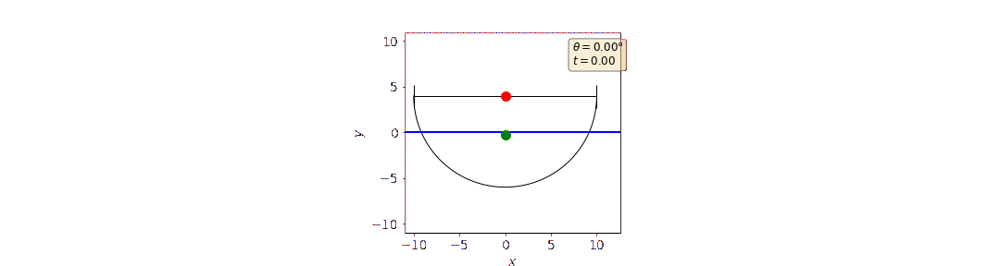

In [24]:
# This function is almost identical to ODE_solver_with_glue_fence, and new chunks are marked by red lines, 
# and single lines by #

def ODE_solver_with_fence(t0, t_end, w0, f,  h, method):
    w_array = np.array([w0])
    t_array = np.array(t0)
    t = t0
    w = w0
    capsize = False
    while t < t_end:
        if t + h > t_end:
            h = t_end - t
        if not capsize:
            theta = w[0]
            delta_yC = w[3]-y_C0
            capsize = abs(theta) > (np.pi-gamma(theta, delta_yC))/2
        if capsize:
            t += h
            w = np.zeros(len(w0))
            w[0] = np.sign(w_array[-1][0])*np.pi/2
        else:
            t, w = method(f, t, w, h)
        overboard = np.abs(w[6]) > R #Criteria for losing the cargo. 
        """New code below"""
        # The only difference from the original function is that we allow the cargo to continue
        # to move, and therefore no longer use the glued-variable.  
        if overboard:
            w[6]=np.sign(w[6])*R
            w[7]=0
        """New code above"""
        w_array = np.vstack((w_array, w))
        t_array = np.append(t_array, t)
        
    return t_array, w_array, capsize, t_end

new_equilibrium_constants(m_L)

m_L = 0.01*m

new_equilibrium_constants(m_L)

t0, t_end = 0, 40

theta0, omega0 = np.radians(0), 0.2
x0, y0 = 0, y_C0
vx0, vy0 = 0, 0
sL0, vL0 = 0, 0
w0 = np.array([theta0, omega0, x0, y0, vx0, vy0, sL0, vL0]) #initial values

h = 0.01
    
t_array0, w_array0, capsize, t_overboard = ODE_solver_with_fence(t0, t_end, w0, f_with_cargo, h, RK4_step)

t = t_array0
theta = w_array0[:,0]
x_C = w_array0[:,2]
y_C = w_array0[:,3]
s_L = w_array0[:,6]

animate_deck_movement(t, theta, x_C, y_C, s_L, gjerde = True, filename='cargowithfences.gif')
with open('cargowithfences.gif','rb') as file:
    display(Image(file.read()))

Ovenfor ser vi en animasjon av vår implementasjon for last på skipet, uten lim-gjerder. Her får vi altså en ganske annerledes situasjon enn det vi gjorde med lim-gjerder. I og med at lasta nå får bevege seg videre etter en kollisjon, vil vi ikke lenger få et stort bidrag til skipets dreiemoment fra lasta like lenge. Dette så vi tidligere at påvirket skipets stabilitet i stor grad, og forårsaket kantring lettere. 

I bevegelsen vi nå står ovenfor er vi interesserte i hvor stor grad lastens masse påvirker skipets stabilitet. Da ser vi igjen bort fra friksjon og bølger, for å isolere lastas effekt på stabiliteten. Fremgangsmåten her blir lik det vi tidligere har gjort for å finne $\omega_k$ for bare skipet, men vi vil nå finne ut hvordan $\omega_k$ avhenger av lastens masse.

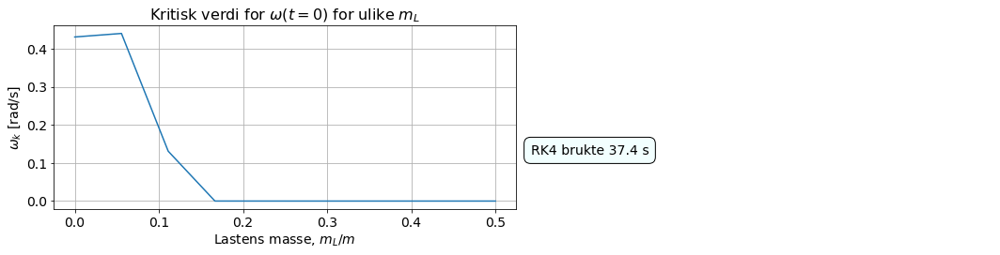

In [26]:
### Plot below ###

#Initial conditions for ship and cargo

t0, t_end = 0, 20

theta0, omega0 = np.radians(0), 0
x0, y0 = 0, 0
vx0, vy0 = 0, 0
sL0, vL0 = 0, 0
w0 = np.array([theta0, omega0, x0, y0, vx0, vy0, sL0, vL0]) #initial values

h0 = 0.01

m_L_factor_array = np.linspace(0, 0.5,  10)
omega_k_array = np.array([])

tol = 1E-5
start = time.time()

for factor in m_L_factor_array:
    m_L = m * factor
    new_equilibrium_constants(m_L)
    w0[3] = y_C0
    omega_k, num_iter, error = bisection(w0, 0, 1, f_with_cargo, ODE_solver_with_fence, RK4_step, tol)
    omega_k_array = np.append(omega_k_array, omega_k)

end = time.time()
elapsedTime = end - start

plt.figure()
plt.subplot(121)
plt.title(r"Kritisk verdi for $\omega(t=0)$ for ulike $m_L$")
plt.plot(m_L_factor_array, omega_k_array)
plt.xlabel(r"Lastens masse, $m_L/m$")
plt.ylabel(r"$\omega_k$ [rad/s]")
plt.grid()

plt.subplot(122)
plt.text(0, 0.3, f"RK4 brukte {elapsedTime:.1f} s", size=14, bbox=dict(boxstyle="round, pad=0.5",fc=(0.95, 1, 1)))
plt.axis("off")
plt.tight_layout()
plt.show()

Over har vi plottet $\omega_k $ mot lastens masse relativt til skipets masse, med 10 jevnt fordelte verdier mellom 0 og 50% av skipets masse. Her får vi en ganske hakkete graf fordi vi har et smalt datagrunnlag. Å skulle veie opp for dette er derimot svært beregningskrevende og tar lang tid.

På grunn av dette ønsker vi nå å implementere en ny metode som kan tillate oss å gjøre flere målinger, samtidig som vi får overkommelige kjøretider. Vi ønsker hovedsaklig å ta i bruk en adaptiv metode, slik at vi kan ha en varierende steglengde. Algoritmen vil da regne ut en passende steglengde basert på hvor stor feil vi får, slik at vi ikke må bruke en mindre steglengde enn nødvendig. 

Vi har valgt å se på Dormand-Prince 5(4), som er en annen metode i Runge-Kutta-familien. Denne metoden bruker syv trinn for å regne ut 4. og 5. ordens løsninger. Her antar vi at den 5. ordens løsningen vil være så nærme den analytiske løsningen, at vi kan tilnærme feilen i den 4. ordens metoden med differansen mellom den 4. og 5. ordens metoden. Denne lokale feilen blir så brukt til å justere steglengdene, i håp om å minske både kjøretid og den globale feilen. Når denne estimerte feilen til slutt er mindre enn en gitt toleranse, vil verdien bli akseptert. Vi bruker også lokal ekstrapolasjon, som vil si at vi bruker løsningen fra den høyeste ordens metoden i hvert steg, da denne vil gi et bedre estimat.

Dormand-Prince har i tillegg en FSAL-egenskap, slik at vi i praksis kun må gjøre 6 funksjonsevalueringer per steg. Metoden er også laget for å gi minst mulig feil i 5. ordens løsning, i motsetning til Runge-Kutta 4(5), noe som er hensiktsmessig når vi bruker lokal ekstrapolasjon (Wikipedia, 2022).

I implementasjonen av denne løseren, har vi først definert en steg-funksjon, som for Runge-Kutta 4. For selve løseren har vi derimot brukt mye av rammeverket fra tidligere ODE-løsere, men vi har også lagt på mer funksjonalitet, for å implementere adaptive steglengder. Den adaptive egenskapen er inspirert av kode fra dokumentet "Numerical solution of ordinary differential equations" av Anne Kværnø (Kværnø, 2022).

In [27]:
def dormand_prince_step(f, t, w, h, k1):
    k2 = f(t + 1/5*h, w + 1/5*h*k1) 
    k3 = f(t +3/10*h, w + 3/40*h*k1 + 9/40*h*k2)
    k4 = f(t + 4/5*h, w + 44/45*h*k1 - 56/15*h*k2 + 32/9*h*k3) 
    k5 = f(t + 8/9*h, w + 19372/6561*h*k1-25360/2187*h*k2+64448/6561*h*k3-212/729*h*k4)
    k6 = f(t + h, w + 9017/3168*h*k1-355/33*h*k2+46732/5247*h*k3+49/176*h*k4-5103/18656*h*k5)
    
    t_next = t + h 
    w_next = w + 35/384*h*k1 + 500/1113*h*k3 + 125/192*h*k4 - 2187/6784*h*k5 + 11/84*h*k6
    
    k7 = f(t_next, w_next)
    
    z_next = w + 5179/57600*h*k1 + 7571/16695*h*k3 + 393/640*h*k4 - 92097/339200*h*k5 + 187/2100*h*k6 + 1/40*h*k7 #Used to calculate error estimate
    error_estimate = norm(z_next - w_next)

    return t_next, w_next, error_estimate, k7 #Returns k7, as k7 is equal to k1 in the next step

#Based on the 'ode_solver' from the notebook
def dormand_prince(t0, t_end, w0, f, h0, method = dormand_prince_step, tol = 1.e-5, P = 0.8):
    w_array = np.array([w0])    # Array for the solutions y
    t_array = np.array([t0])    # Array for the x-values
    
    tn = t0                 # Running values for  x, y and the stepsize h
    wn = w0 
    h = h0
    k1 = f(t0, w0)          #Calculates the very first value for k1
    p = 4                   #Order of z_next, the lowest order of the methods in dormand prince
    Maxcall = 100000        # Maximum allowed calls of method
    ncall = 0
    capsize= False
    while tn < t_end - 1.e-10:               # Buffer for truncation error
        # Adjust the stepsize for the last step
        if tn + h > t_end:                   
            h = t_end - tn 

        if not capsize:
            theta = wn[0]
            delta_yC = wn[3]-y_C0
            capsize = abs(theta) > (np.pi-gamma(theta, delta_yC))/2
        if capsize:
            t_try += h
            w_try = np.zeros(len(w0))
            w_try[0] = np.sign(w_array[-1][0])*np.pi/2 #We update theta to be sign(last angle) * pi/2 and all other
            error_estimate = tol/10 #the error estimate is set to tol/10, to ensure that the values are accepted
            #after the ship has capsized, we will no longer be calling the method
        else:
            t_try, w_try, error_estimate, k_try = method(f, tn, wn, h, k1)
            
        if abs(w_try[6]) > R:
            w_try[6]=np.sign(w_try[6])*R
            w_try[7]=0
        
        ncall = ncall + 1
        
        if error_estimate <= tol:   
            # Solution accepted, update x and y
            tn = t_try    
            wn = w_try
            k1 = k_try
            # Store the solutions 
            w_array = np.concatenate((w_array, np.array([wn])))
            t_array = np.append(t_array, tn)
        
        # else: The step rejectes and nothing is updated. 
        
        # Adjust the stepsize
        h = P*(tol/error_estimate)**(1/(p+1))*h
        
        # Stop with a warning in the case of max calls to method
        if ncall > Maxcall:
            print('Maximum number of method calls')
            return t_array, w_array, capsize, t_end
            
    return t_array, w_array, capsize, t_end

Etter å ha implementert denne metoden, ønsker vi nå å teste metodene våre mot hverandre. Da vil vi bruke  situasjonen vi nå ser på, altså skip med last og vanlige gjerder, og se hvor stort avvik vi får mellom løsningene med de ulike metodene. Vi har da satt initialbetingelsene til $\omega_0 = 0.1$ rad/s, og vi bruker en masse på $m_L=0.08m$. Resten er satt slik at skipet starter fra likevekt. Vi forventer da at Dormand-Prince vil bruke kortere tid, som følge av at metoden er av orden 5 og er adaptiv, samtidig som vi nok vil få ganske lite avvik mellom løsningene.

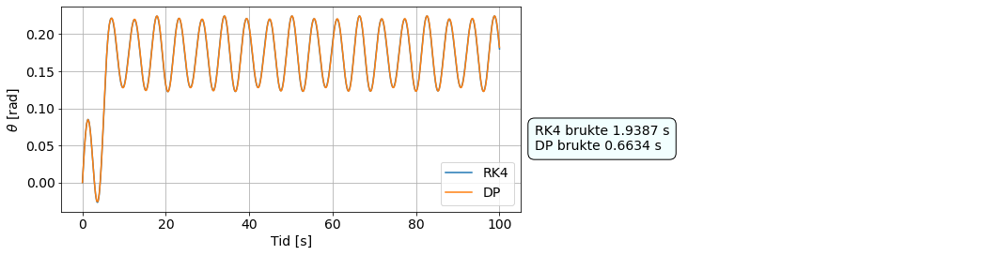

In [28]:

m_L = 0.08*m
new_equilibrium_constants(m_L)

t0, t_end = 0, 100
theta0, omega0 = 0, 0.1

w0 = np.array([theta0, omega0, 0, y_C0, 0, 0, 0, 0])

#Dormand-Prince with tol=1E-5

h0 = 0.1 #initial step size for the Dormand-Prince method

startDP = time.time()  
t_DP, w_DP, capsize, t_slutt = dormand_prince(t0, t_end, w0, f_with_cargo, h0, dormand_prince_step, tol=1E-5)
endDP = time.time()
DP_time = endDP-startDP

#RK4 WITH h=0.01

h=0.01

startRK4 = time.time()
t_RK4, w_RK4, capsize, t_slutt = ODE_solver_with_fence(t0, t_end, w0, f_with_cargo, h, RK4_step)
endRK4 = time.time()
RK4_time = endRK4-startRK4
  
### Plot below ###

plt.figure(figsize=(15, 4))
plt.subplot(121)
plt.plot(t_RK4, w_RK4[:,0], label = "RK4")
plt.plot(t_DP, w_DP[:,0], label = "DP")
plt.xlabel("Tid [s]")
plt.ylabel(r"$\theta$ [rad]")
plt.grid()
plt.legend(loc=4)

plt.subplot(122)
plt.text(0, 0.3, f"RK4 brukte {RK4_time:.4f} s\n" 
                +f"DP brukte {DP_time:.4f} s", size=14, bbox=dict(boxstyle="round, pad=0.5",fc=(0.95, 1, 1)))
plt.axis("off")
plt.tight_layout()
plt.show()

Over ser vi at resultatene fra de to metodene er omtrent like, men Dormand-Prince kjører omtrent to ganger så raskt. Videre er en klar fordel ved Dormand-Prince at den lar oss begrense den lokale feilen, noe RK4 ikke kan. For oss har hovedproblemet så langt vært kjøretid, så vil vil derfor fokusere på å minimere den og ikke nødvendigvis feilen. Derfor vil vi nå bruke Dormand-Prince for å få et bredere datagrunnlag for $\omega_k(m_L)$. Vi finner nå $\omega_k$ for hundre ulike masser, ti ganger mer enn tidligere.

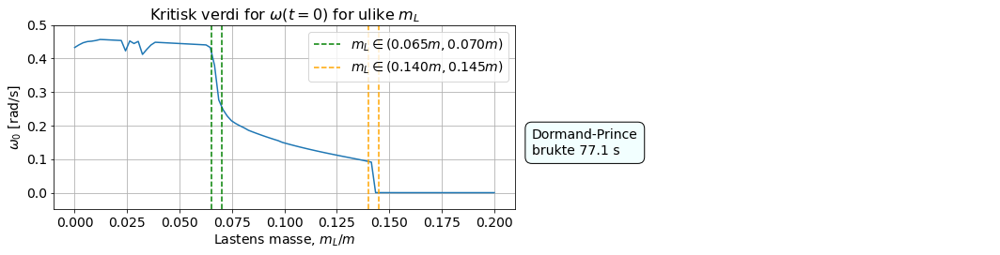

In [29]:
### Plot below ###
t0, t_end = 0, 20

theta0, omega0 = 0, 0
x0, y0 = 0, y_C0
vx0, vy0 = 0, 0
sL0, vL0 = 0, 0
w0 = np.array([theta0, omega0, x0, y0, vx0, vy0, sL0, vL0]) #initial values

h0 = 0.1

m_L_factor_array = np.linspace(0, 0.2,  100)
omega_0_array = np.array([])

tol = 1E-5
start = time.time()
for factor in m_L_factor_array:
    m_L = m * factor
    new_equilibrium_constants(m_L)
    w0[3] = y_C0
    omega_0, num_iter, error = bisection(w0, 0, 1, f_with_cargo, dormand_prince, dormand_prince_step, tol)
    omega_0_array = np.append(omega_0_array, omega_0)

end = time.time()
elapsedTime = end - start

plt.figure()
plt.subplot(121)
plt.title(r"Kritisk verdi for $\omega(t=0)$ for ulike $m_L$")
plt.plot(m_L_factor_array, omega_0_array)
plt.vlines(0.065, -0.05, 0.5, colors='green', linestyles = 'dashed', label = r"$m_L \in (0.065m, 0.070m)$")
plt.vlines(0.07, -0.05, 0.5, colors='green', linestyles = 'dashed')
plt.vlines(0.14, -0.05, 0.5, colors='orange', linestyles = 'dashed', label = r"$m_L \in (0.140m, 0.145m)$")
plt.vlines(0.145, -0.05, 0.5, colors='orange', linestyles = 'dashed')
plt.xlabel(r"Lastens masse, $m_L/m$")
plt.ylabel(r"$\omega_0$ [rad/s]")
plt.ylim(-0.05,0.5)
plt.legend()
plt.grid()

plt.subplot(122)
plt.text(0, 0.3, f"Dormand-Prince\nbrukte {elapsedTime:.1f} s", size=14, bbox=dict(boxstyle="round, pad=0.5",fc=(0.95, 1, 1)))
plt.axis("off")
plt.tight_layout()
plt.show()

Over har vi kun plottet for verdier av $m_L/m$ mellom $0$ og $0.2$, siden vi tidligere så at masser større enn $0.2m$ vil gi kantring nesten uansett hvor lav $\omega_0$ er. Generelt ser vi at vi får en ganske lik form på denne grafen, og den vi fikk med RK4, men at vi nå ser visse trekk enda klarere.

Ved små $m_L/m$ får vi en hakkete graf, som generelt ligger litt over $\omega_k$ verdien for skip uten last. Dette kan skyldes at den ekstra massen veier opp for små økninger i $\omega$ og gjør dermed skipet litt mer stabilt. Hvis vi ser bort fra hakkene er den nesten lineær fra $0.01m$  til $0.06m$, så det er altså en generell trend. For større $m_L/m$ får vi en synkende graf, som var det vi forventet siden større masser vil gi et økt bidrag til dreiemomentet når $s_L$ er ulik $0$ i tillegg til økte fluktueringer for $y_C$.

Mest interessant er kanskje at det er to områder hvor grafen endres drastisk, rundt $m_L=0.07m$ og $m_L=0.14m$. Her vil  en liten økning i $m_L$ gi en stor nedgang i $\omega_k$. Vi finner ingen klar grunn til at resultatene bør være sånn rent fysisk, og vi ønsker derfor nå å studere dynamikken i disse områdene nærmere.  Da vil vi fokusere på det første bratte fallet i grafen, og se på massene markert med grønne linjer.

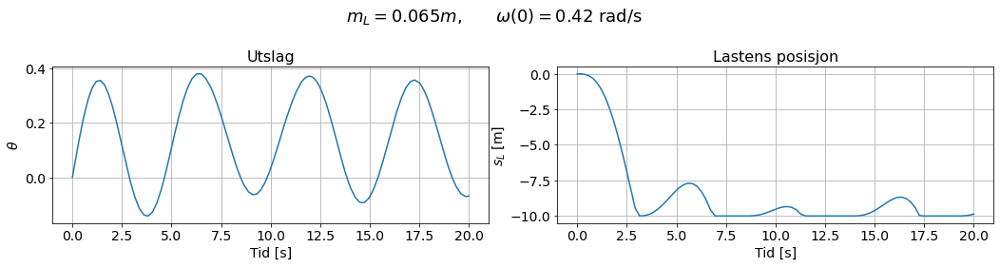

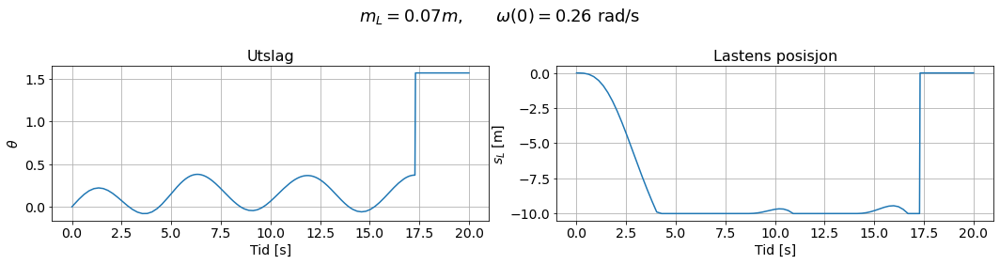

In [30]:
### Plot below ###

#INITIAL VALUES 1

m_L = 0.065*m
new_equilibrium_constants(m_L)

t0, t_end = 0, 20

theta0, omega0 = 0, 0.42
x0, y0 = 0, y_C0
vx0, vy0 = 0, 0
sL0, vL0 = 0, 0
w0 = np.array([theta0, omega0, x0, y0, vx0, vy0, sL0, vL0]) #initial values

h0 = 0.1
    
t_array, w_array, capsize, t_slutt = dormand_prince(t0, t_end, w0, f_with_cargo, h0)

t = t_array
theta = w_array[:,0]
x_C = w_array[:,2]
y_C = w_array[:,3]
s_L = w_array[:,6]

#PLOT 1

plt.figure(figsize=(15,4))
plt.suptitle(r"$m_L=$"+f"{m_L/m:.3}"+r"$m$," + r"$\qquad\omega(0)=$" + f"{omega0:.2} rad/s")
plt.subplot(121)
plt.title("Utslag")
plt.plot(t_array, theta)
plt.xlabel("Tid [s]")
plt.ylabel(r"$\theta$")
plt.grid()

plt.subplot(122)
plt.title("Lastens posisjon")
plt.plot(t_array, s_L)
plt.xlabel("Tid [s]")
plt.ylabel(r"$s_L$ [m]")
plt.grid()
plt.tight_layout()
plt.show()

#INITIAL VALUES 2

m_L = 0.07*m
new_equilibrium_constants(m_L)

t0, t_end = 0, 20

theta0, omega0 = 0, 0.26
x0, y0 = 0, y_C0
vx0, vy0 = 0, 0
sL0, vL0 = 0, 0
w0 = np.array([theta0, omega0, x0, y0, vx0, vy0, sL0, vL0]) #initial values

h0 = 0.1
    
t_array, w_array, capsize, t_slutt = dormand_prince(t0, t_end, w0, f_with_cargo, h0)
t = t_array
theta = w_array[:,0]
x_C = w_array[:,2]
y_C = w_array[:,3]
s_L = w_array[:,6]

#PLOT 2

plt.figure(figsize=(15,4))
plt.suptitle(r"$m_L=$"+f"{m_L/m:.3}"+r"$m$," + r"$\qquad \omega(0)=$" + f"{omega0:.2} rad/s")
plt.subplot(121)
plt.title("Utslag")
plt.plot(t_array, theta)
plt.xlabel("Tid [s]")
plt.ylabel(r"$\theta$")
plt.grid()

plt.subplot(122)
plt.title("Lastens posisjon")
plt.plot(t_array, s_L)
plt.xlabel("Tid [s]")
plt.ylabel(r"$s_L$ [m]")
plt.grid()
plt.tight_layout()
plt.show()

Fra plottene ser vi at en økning på bare $0.5$ prosentpoeng i $m_L/m$ gir en ganske drastisk endring i stabilitet, slik grafen vi tidligere presenterte også tydet på. Selv for en verdi på $\omega_0=0.42$ rad/s, ser vi at en last på $m_L=0.065m$ ikke får kantring, mens vi med en last på $m_L=0.07m$ får kantring allerede ved $\omega_0=0.26$ rad/s. 

Fra grafen for $s_L$ ser vi at vi i tillegg vil få mye mer variasjon i posisjonen til lasta for $m_L=0.065m$, mens lasta $m_L=0.07m$ vil ligge mer langs kanten på skipet. Vi tenker at dette kan bidra til å forklare resultatene vi fikk tidligere, der $m_L\geq0.07m$ ikke vil gli tilbake like lett, noe som følgelig gir lavere stabilitet, ettersom vi da får større bidrag til dreiemomentet. Dermed er vi også sikrere på at i vår modell, vil en slik liten endring av massen, i enkelte tilfeller gi dramatiske konsekvenser. 

Gjennom dette prosjektet har vi studert stabiliteten til skip, og vi har studert hvordan ulike ODE-løsere egner seg til å studere dette problemet.

Når det kommer til ODE-løsere har vi sett at Eulers metode ga en relativt stor feil i forhold til Runge-Kutta 4, og vi har derfor i stor grad holdt oss til RK4 gjennom prosjektet. Denne metoden er relativt enkel og implementere, og var derfor nyttig for å få et overblikk over situasjonene vi jobbet med. Når vi derimot hev oss i gang med litt mer beregningskrevende simulasjoner ble det fort klart at metoden ikke lenger holdt mål kjøretidsmessig. Derfor implementerte vi også Dormand-Prince 5(4), og så at dette var en metode som ga oss lave kjøretider, samtidig som vi fikk nøyaktige nok resultater. Dette ga oss muligheten til å gå dypere inn i den første dataen vi hadde fått med RK4, og dermed lære mer om skipets stabilitet.

Denne stabilititen har vært et hovedfokus gjennom hele prosjektet, og ODE-løserene har altså vært et essensielt verktøy for å få kunnskap om denne egenskapen. Her har den minste startvinkelhastigheta som gir kantring, $\omega_k$, vært spesielt interessant. Det har også implementasjonen av bølgekrefter og å få se et eksempel på fenomenet svevning vært. Vi har også sett mye på hvordan løs last vil kunne påvirke skipet, og vi har også sett at gjerder, eller mangel på dem, har en stor innvirkning på skips stabilitet. 

**Kilder:**

Aase, Ellingsen, Støvneng (25. februar 2022). *TMA4320 vår 2022 - Prosjekt i teknisk fysikk*. Hentet 13. Mars 2022 fra https://wiki.math.ntnu.no/_media/tma4320/2022v/tekfysprosjekt_vitber_2022.pdf

Anne Kværnø (11. februar 2022a). *Numerical Solution of Nonlinear Equations*. Hentet 13. Mars 2022 fra https://www.math.ntnu.no/emner/TMA4320/2022v/pdf/NonLinearEquations.pdf

Anne Kværnø (18. februar 2022b). *Numerical solution of ordinary differential equations*. Hentet 13. Mars 2022 fra http://www.math.ntnu.no/emner/TMA4320/2022v/pdf/ODE.pdf

Wikipedia (8. februar 2022). *Dormand-Prince method*. Hentet 13. Mars 2022 fra https://en.wikipedia.org/wiki/Dormand%E2%80%93Prince_method


<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=ff504319-1046-4397-bb9e-5015169e381d' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>